**Expected Returns Analysis**

In [1]:
%%sql
select * from analytics.expected_returns_summary ers

,isin,ticker,name,description,region,country,trading_country,exchange,sector,industry,...,implied_return_mc_zscore,price_target_mc_zscore,implied_return_kalman_zscore,price_target_kalman_zscore,implied_return_pt_zscore,implied_return_mc_pctile,price_target_mc_pctile,implied_return_kalman_pctile,price_target_kalman_pctile,implied_return_pt_pctile
0,IT0005525347,MGS,Magis S.p.A.,Magis S.p.A. engages in the manufacture and sa...,Europe,IT,IT,BIT,Materials,Chemicals,...,0.739069,-0.131945,0.753494,-0.123141,0.267900,91.489362,15.319149,89.855072,16.304348,70.289855
1,US67080M1036,NRIX,Nurix Therapeutics Inc.,Nurix Therapeutics Inc. a clinical stage bioph...,United States and Canada,US,US,NasdaqGM,Health Care,Biotechnology,...,0.227984,-0.132163,0.376048,-0.129734,0.314298,72.602740,34.703196,71.428571,33.877551,78.775510
2,CA68828E8099,ODV,Osisko Development Corp.,Osisko Development Corp. together with its sub...,United States and Canada,CA,CA,TSXV,Materials,Metals and Mining,...,1.640593,-0.079886,1.718710,-0.072270,1.975382,94.718310,20.422535,93.802817,22.816901,97.183099
3,US54572F1012,LOT,Lotus Technology Inc.,Lotus Technology Inc. engages in the design de...,Asia / Pacific,CN,US,NasdaqGS,Consumer Discretionary,Automobiles,...,1.838642,-0.176663,2.201516,-0.172486,-0.868152,96.721311,4.918033,96.875000,4.687500,20.312500
4,FR0000121014,MC,LVMH Moët Hennessy - Louis Vuitton Société Eur...,LVMH Moët Hennessy - Louis Vuitton Société Eur...,Europe,FR,FR,ENXTPA,Consumer Discretionary,Textiles Apparel and Luxury Goods,...,-0.030486,-0.112284,-0.003906,-0.104352,-0.653751,54.054054,86.486486,57.317073,87.804878,25.609756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6677,MA0000010951,GAZ,Afriquia Gaz SA,Afriquia Gaz SA engages in the distribution of...,Africa / Middle East,MA,MA,CBSE,Energy,Oil Gas and Consumable Fuels,...,NaN,NaN,0.029520,0.077093,0.225210,NaN,NaN,67.482517,96.503497,69.580420
6678,IT0005373417,ELES,ELES Semiconductor Equipment S.p.A.,ELES Semiconductor Equipment S.p.A. designs ma...,Europe,IT,IT,BIT,Information Technology,Semiconductors and Semiconductor Equipment,...,NaN,NaN,-0.442375,-0.126082,-0.089337,NaN,NaN,32.421875,2.343750,31.250000
6679,FR0000053043,ALAVI,AdVini S.A.,AdVini S.A. engages in the production trading ...,Europe,FR,FR,ENXTPA,Consumer Staples,Beverages,...,NaN,NaN,-0.130014,-0.436301,0.869194,NaN,NaN,48.809524,21.428571,90.476190
6680,BE0974265945,FLUX,Fluxys Belgium SA,Fluxys Belgium SA an infrastructure company en...,Europe,BE,BE,ENXTBR,Energy,Oil Gas and Consumable Fuels,...,NaN,NaN,0.458119,-0.128943,0.709471,NaN,NaN,88.811189,41.258741,92.657343


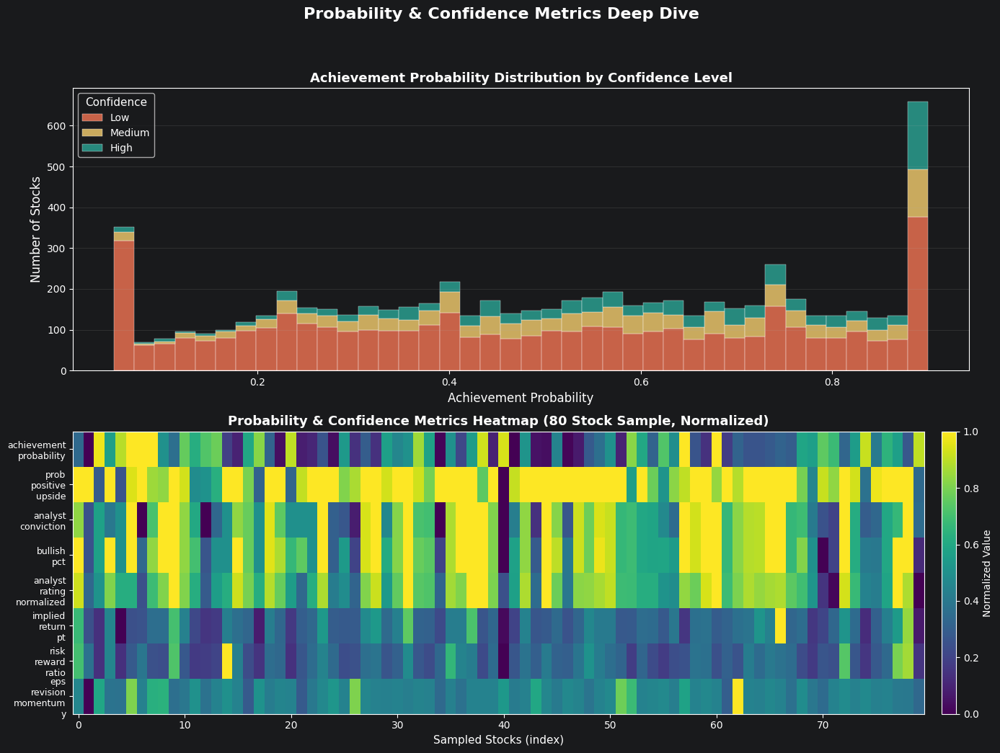

In [2]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 1, figsize=(14, 10), gridspec_kw={'height_ratios': [1, 1]})
fig.suptitle('Probability & Confidence Metrics Deep Dive', fontsize=16, fontweight='bold', y=1.04)

# --- Panel 1: Stacked histogram of achievement probability by confidence level ---
ax1 = axes[0]
conf_levels = ['Low', 'Medium', 'High']
conf_colors = {'Low': '#E76F51', 'Medium': '#E9C46A', 'High': '#2A9D8F'}
conf_data = []
for cl in conf_levels:
    conf_data.append(returns_df.loc[returns_df['confidence_level'] == cl, 'achievement_probability'].dropna().values)

ax1.hist(conf_data, bins=40, stacked=True, color=[conf_colors[c] for c in conf_levels],
         label=conf_levels, alpha=0.85, edgecolor='white', linewidth=0.3)
ax1.set_xlabel('Achievement Probability', fontsize=12)
ax1.set_ylabel('Number of Stocks', fontsize=12)
ax1.set_title('Achievement Probability Distribution by Confidence Level', fontsize=13, fontweight='bold')
ax1.legend(title='Confidence', fontsize=10, title_fontsize=11)
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.grid(axis='y', alpha=0.2)

# --- Panel 2: Probability metrics heatmap (sampled) ---
ax2 = axes[1]
prob_cols = [
    'achievement_probability', 'mh_achievement_probability',
    'prob_positive_upside', 'analyst_conviction', 'bullish_pct',
    'analyst_rating_normalized', 'implied_return_pt',
    'risk_reward_ratio', 'eps_revision_momentum_y'
]
available_cols = [c for c in prob_cols if c in returns_df.columns]

sample_n = min(80, len(returns_df))
sample_df = returns_df[available_cols].dropna().sample(n=sample_n, random_state=42)

# Normalize each column to [0, 1] for heatmap display
normed = sample_df.copy()
for col in normed.columns:
    cmin, cmax = normed[col].min(), normed[col].max()
    if cmax > cmin:
        normed[col] = (normed[col] - cmin) / (cmax - cmin)
    else:
        normed[col] = 0.5

labels_x = [c.replace('_', '\n') for c in normed.columns]
im2 = ax2.imshow(normed.values.T, cmap='viridis', aspect='auto', interpolation='nearest')
ax2.set_yticks(range(len(labels_x)))
ax2.set_yticklabels(labels_x, fontsize=9)
ax2.set_xlabel('Sampled Stocks (index)', fontsize=11)
ax2.set_title('Probability & Confidence Metrics Heatmap (80 Stock Sample, Normalized)',
              fontsize=13, fontweight='bold')
plt.colorbar(im2, ax=ax2, fraction=0.03, pad=0.02, label='Normalized Value')

plt.tight_layout()
plt.show()

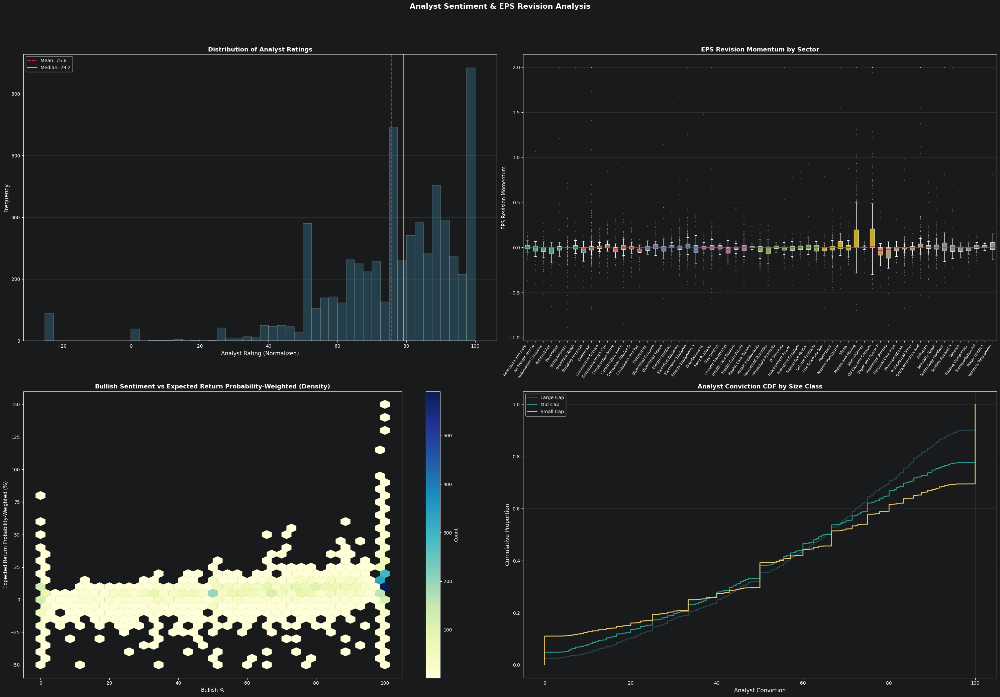

In [3]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(30, 20))
fig.suptitle('Analyst Sentiment & EPS Revision Analysis', fontsize=16, fontweight='bold', y=1.04)

# --- Panel 1: Analyst Rating Normalized histogram ---
ax1 = axes[0, 0]
rating = returns_df['analyst_rating_normalized'].dropna()
ax1.hist(rating, bins=50, color='#264653', alpha=0.85, edgecolor='white', linewidth=0.3)
ax1.axvline(rating.mean(), color='#E63946', linestyle='--', linewidth=1.8, label=f'Mean: {rating.mean():.1f}')
ax1.axvline(rating.median(), color='#E9C46A', linestyle='-', linewidth=1.8, label=f'Median: {rating.median():.1f}')
ax1.set_xlabel('Analyst Rating (Normalized)', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('Distribution of Analyst Ratings', fontsize=13, fontweight='bold')
ax1.legend(fontsize=10)
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.grid(axis='y', alpha=0.2)

# --- Panel 2: EPS Revision Momentum boxplot by sector ---
ax2 = axes[0, 1]
sectors = sorted(returns_df['industry'].dropna().unique())
eps_data = [returns_df.loc[returns_df['industry'] == s, 'eps_revision_momentum_y'].dropna().clip(-2, 2).values for s in
            sectors]
sector_labels = [s[:18] for s in sectors]

bp2 = ax2.boxplot(eps_data, vert=True, patch_artist=True, widths=0.55,
                  medianprops=dict(color='#E63946', linewidth=2),
                  flierprops=dict(marker='.', markersize=2, alpha=0.3))
colors_list = plt.cm.Set2(np.linspace(0, 1, len(sectors)))
for patch, c in zip(bp2['boxes'], colors_list):
    patch.set_facecolor(c)
    patch.set_alpha(0.75)
ax2.set_xticklabels(sector_labels, rotation=55, ha='right', fontsize=8)
ax2.axhline(0, color='grey', linestyle=':', linewidth=0.8)
ax2.set_ylabel('EPS Revision Momentum', fontsize=11)
ax2.set_title('EPS Revision Momentum by Sector', fontsize=13, fontweight='bold')
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)
ax2.grid(axis='y', alpha=0.2)

# --- Panel 3: Bullish % vs Expected Return Probability-Weighted hex density ---
ax3 = axes[1, 0]
valid = returns_df[['bullish_pct', 'implied_return_pt']].dropna()
x_vals = valid['bullish_pct'].values
y_vals = valid['implied_return_pt'].clip(-50, 150).values
hb = ax3.hexbin(x_vals, y_vals, gridsize=35, cmap='YlGnBu', mincnt=1, linewidths=0.2)
plt.colorbar(hb, ax=ax3, label='Count')
ax3.set_xlabel('Bullish %', fontsize=11)
ax3.set_ylabel('Expected Return Probability-Weighted (%)', fontsize=11)
ax3.set_title('Bullish Sentiment vs Expected Return Probability-Weighted (Density)', fontsize=13, fontweight='bold')
ax3.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)

# --- Panel 4: Analyst Conviction CDF by size class ---
ax4 = axes[1, 1]
size_classes = ['Large Cap', 'Mid Cap', 'Small Cap']
size_colors = {'Large Cap': '#264653', 'Mid Cap': '#2A9D8F', 'Small Cap': '#E9C46A'}
for sc in size_classes:
    vals = returns_df.loc[returns_df['size_class'] == sc, 'analyst_conviction'].dropna().sort_values()
    cdf = np.arange(1, len(vals) + 1) / len(vals)
    ax4.plot(vals.values, cdf, color=size_colors[sc], linewidth=2, label=sc)
ax4.set_xlabel('Analyst Conviction', fontsize=12)
ax4.set_ylabel('Cumulative Proportion', fontsize=12)
ax4.set_title('Analyst Conviction CDF by Size Class', fontsize=13, fontweight='bold')
ax4.legend(fontsize=10)
ax4.spines['top'].set_visible(True)
ax4.spines['right'].set_visible(True)
ax4.grid(alpha=0.2)

plt.tight_layout()
plt.show()

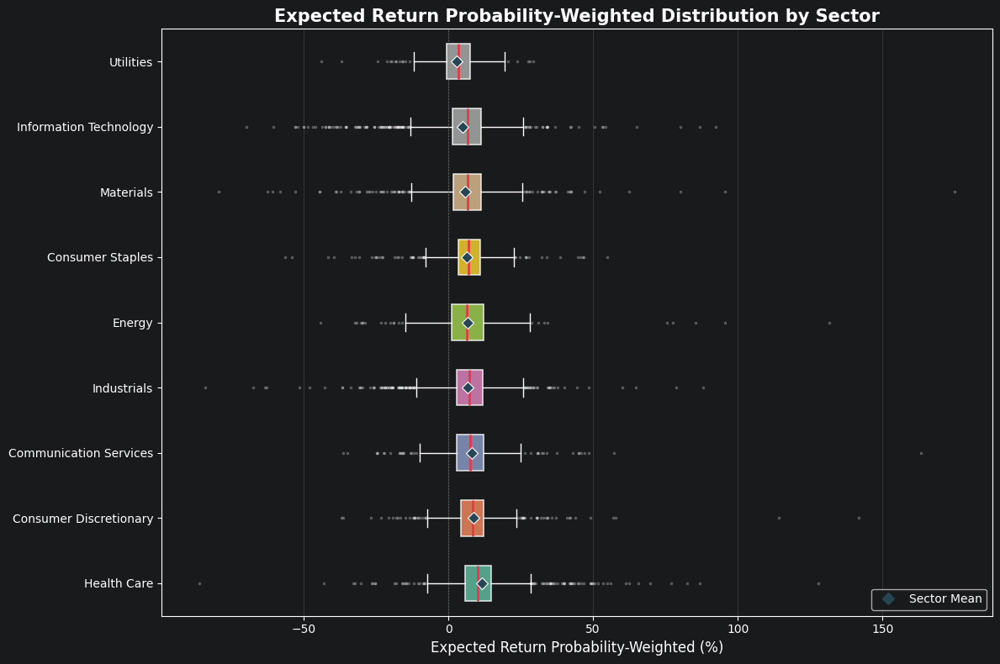

In [4]:
import matplotlib.pyplot as plt
import numpy as np

sectors = sorted(returns_df['sector'].dropna().unique())
fig, ax = plt.subplots(figsize=(12, 8))

box_data = [returns_df.loc[returns_df['sector'] == s, 'implied_return_pt'].dropna().values for s in sectors]
means = [np.mean(d) for d in box_data]
sectors_sorted = [s for _, s in sorted(zip(means, sectors), reverse=True)]
box_data = [returns_df.loc[returns_df['sector'] == s, 'implied_return_pt'].dropna().values for s in sectors_sorted]

palette = plt.cm.Set2(np.linspace(0, 1, len(sectors_sorted)))

bp = ax.boxplot(
    box_data, vert=False, patch_artist=True, widths=0.55,
    boxprops=dict(linewidth=1.2),
    medianprops=dict(color='#E63946', linewidth=2),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1),
    flierprops=dict(marker='.', markersize=3, alpha=0.3, color='grey')
)

for patch, color in zip(bp['boxes'], palette):
    patch.set_facecolor(color)
    patch.set_alpha(0.8)

ax.set_yticks(range(1, len(sectors_sorted) + 1))
ax.set_yticklabels(sectors_sorted, fontsize=10)
ax.axvline(color='grey', linestyle=':', linewidth=1, alpha=0.6)
ax.set_xlabel('Expected Return Probability-Weighted (%)', fontsize=12)
ax.set_title('Expected Return Probability-Weighted Distribution by Sector', fontsize=15, fontweight='bold')
ax.grid(axis='x', alpha=0.25)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)

for i, d in enumerate(box_data):
    ax.scatter(np.mean(d), i + 1, color='#264653', zorder=5, s=50, marker='D', edgecolors='white', linewidths=0.8)

ax.legend([plt.Line2D([0], [0], marker='D', color='#264653', linestyle='None', markersize=7)],
          ['Sector Mean'], loc='lower right', fontsize=10)

plt.tight_layout()
plt.show()

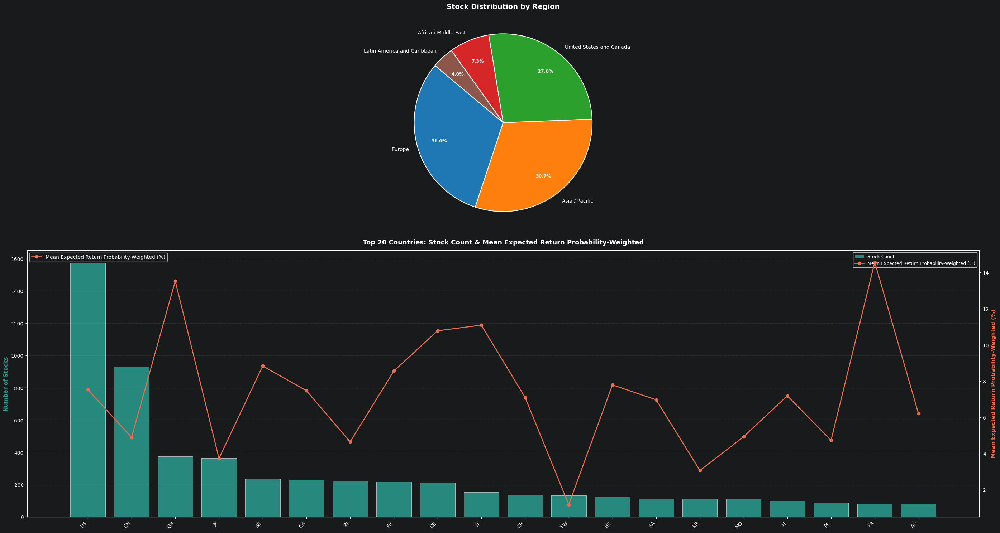

In [5]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 1, figsize=(28, 15), gridspec_kw={'height_ratios': [1, 1.2]})

# --- Top: Pie chart of Region distribution ---
ax_pie = axes[0]
region_counts = returns_df['region'].value_counts()
region_colors = plt.cm.tab10(np.linspace(0, 0.5, len(region_counts)))
wedges, texts, autotexts = ax_pie.pie(
    region_counts.values, labels=region_counts.index, autopct='%1.1f%%',
    colors=region_colors, startangle=140, pctdistance=0.75,
    wedgeprops=dict(edgecolor='white', linewidth=1.5),
    textprops=dict(fontsize=10)
)
for t in autotexts:
    t.set_fontsize(9)
    t.set_fontweight('bold')
ax_pie.set_title('Stock Distribution by Region', fontsize=14, fontweight='bold')

# --- Bottom: Top 20 Countries by count with mean expected upside overlay ---
ax_bar = axes[1]
top_countries = returns_df['country'].value_counts().head(20)
country_names = top_countries.index.tolist()
country_counts = top_countries.values

x = np.arange(len(country_names))
bars = ax_bar.bar(x, country_counts, color='#2A9D8F', edgecolor='white', linewidth=0.5, alpha=0.85, label='Stock Count')
ax_bar.set_ylabel('Number of Stocks', fontsize=11, fontweight='bold', color='#2A9D8F')
ax_bar.set_xticks(x)
ax_bar.set_xticklabels(country_names, fontsize=10, rotation=45, ha='right')
ax_bar.spines['top'].set_visible(True)
ax_bar.spines['right'].set_visible(True)
ax_bar.spines['bottom'].set_visible(True)
ax_bar.spines['left'].set_visible(True)
ax_bar.tick_params(axis='both', which='major', labelsize=10)
ax_bar.legend(loc='upper right', fontsize=10)

# Overlay mean expected upside
ax2_twin = ax_bar.twinx()
mean_upsides = [returns_df.loc[returns_df['country'] == c, 'implied_return_pt'].mean() for c in country_names]
ax2_twin.plot(x, mean_upsides, color='#E76F51', marker='o', linewidth=2, markersize=6,
              label='Mean Expected Return Probability-Weighted (%)')
ax2_twin.set_ylabel('Mean Expected Return Probability-Weighted (%)', fontsize=11, fontweight='bold', color='#E76F51')
ax2_twin.spines['top'].set_visible(True)
ax2_twin.spines['right'].set_visible(True)
ax2_twin.spines['bottom'].set_visible(True)
ax2_twin.spines['left'].set_visible(True)
ax2_twin.tick_params(axis='both', which='major', labelsize=10)
ax2_twin.legend(loc='upper left', fontsize=10)

lines1, labels1 = ax_bar.get_legend_handles_labels()
lines2, labels2 = ax2_twin.get_legend_handles_labels()
ax_bar.legend(lines1 + lines2, labels1 + labels2, fontsize=9, loc='upper right', framealpha=0.9)

ax_bar.set_title('Top 20 Countries: Stock Count & Mean Expected Return Probability-Weighted', fontsize=13,
                 fontweight='bold', pad=12)
ax_bar.grid(axis='y', alpha=0.2, linestyle='--')

fig.tight_layout()
plt.show()

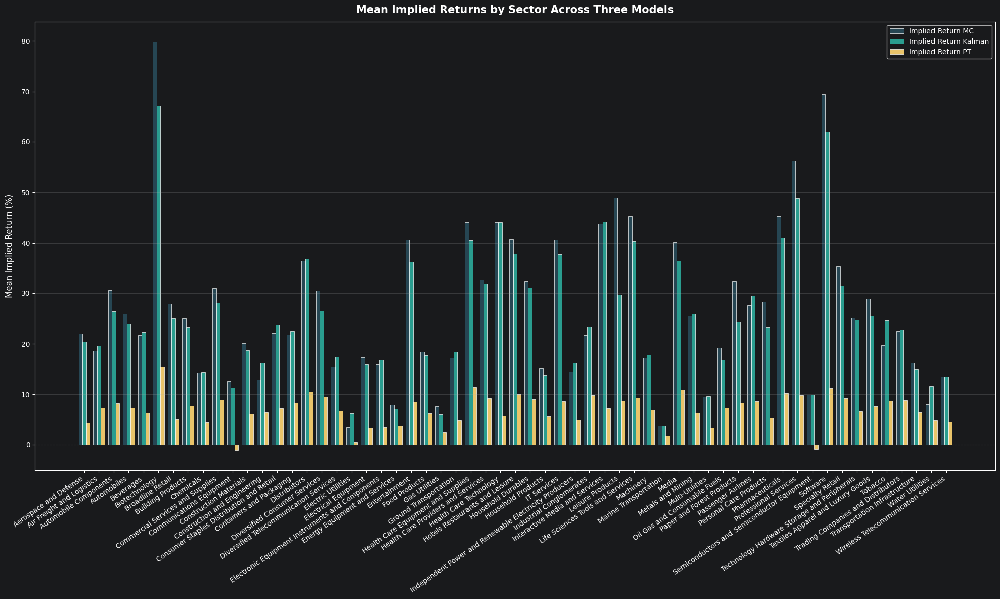

In [6]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(20, 12))

sectors = sorted(returns_df['industry'].unique())
metrics_plot = ['implied_return_mc', 'implied_return_kalman', 'implied_return_pt']
labels_plot = ['Implied Return MC', 'Implied Return Kalman', 'Implied Return PT']
bar_colors = ['#264653', '#2A9D8F', '#E9C46A']

x = np.arange(len(sectors))
width = 0.25

for i, (metric, label, color) in enumerate(zip(metrics_plot, labels_plot, bar_colors)):
    means = [returns_df.loc[returns_df['industry'] == s, metric].mean() for s in sectors]
    ax.bar(x + i * width, means, width, label=label, color=color, edgecolor='white', linewidth=0.5)

ax.set_xticks(x + width)
ax.set_xticklabels(sectors, rotation=35, ha='right', fontsize=10)
ax.set_ylabel('Mean Implied Return (%)', fontsize=12, labelpad=10)
ax.set_title('Mean Implied Returns by Sector Across Three Models', fontsize=15, fontweight='bold', pad=12)
ax.legend(fontsize=10, loc='upper right')
ax.axhline(0, color='gray', linewidth=0.8, linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.grid(axis='y', alpha=0.3)
fig.tight_layout()
plt.show()

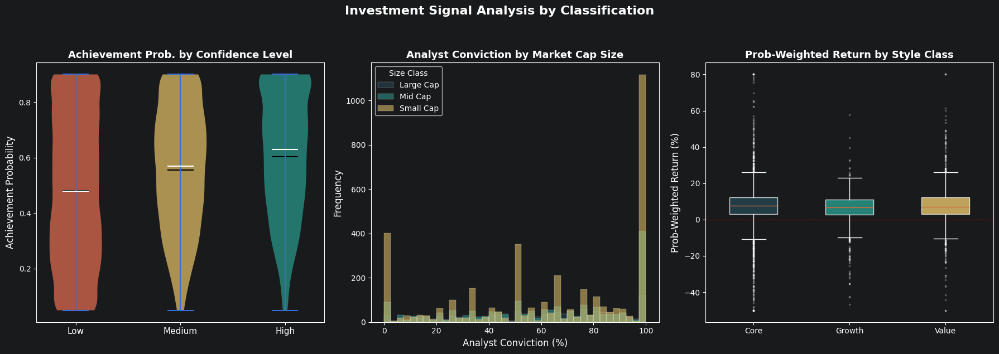

In [7]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Panel 1: Achievement probability by confidence level
ax1 = axes[0]
conf_levels = ['Low', 'Medium', 'High']
conf_data = []
for cl in conf_levels:
    vals = returns_df.loc[returns_df['confidence_level'] == cl, 'achievement_probability'].dropna().values
    if len(vals) > 0:
        conf_data.append(vals)
    else:
        conf_data.append(np.array([0]))

vp = ax1.violinplot(conf_data, positions=range(len(conf_levels)), showmeans=True, showmedians=True)
conf_colors = ['#E76F51', '#E9C46A', '#2A9D8F']
for body, color in zip(vp['bodies'], conf_colors):
    body.set_facecolor(color)
    body.set_alpha(0.7)
vp['cmeans'].set_color('black')
vp['cmedians'].set_color('white')
ax1.set_xticks(range(len(conf_levels)))
ax1.set_xticklabels(conf_levels, fontsize=11)
ax1.set_ylabel('Achievement Probability', fontsize=12)
ax1.set_title('Achievement Prob. by Confidence Level', fontsize=13, fontweight='bold')
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)

# Panel 2: Analyst conviction distribution by size class
ax2 = axes[1]
size_classes = sorted(returns_df['size_class'].unique())
size_colors = {'Large Cap': '#264653', 'Mid Cap': '#2A9D8F', 'Small Cap': '#E9C46A'}
for sc in size_classes:
    vals = returns_df.loc[returns_df['size_class'] == sc, 'analyst_conviction'].dropna()
    ax2.hist(vals, bins=40, alpha=0.55, label=sc, color=size_colors.get(sc, '#999'), edgecolor='white', linewidth=0.3)
ax2.set_xlabel('Analyst Conviction (%)', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Analyst Conviction by Market Cap Size', fontsize=13, fontweight='bold')
ax2.legend(title='Size Class', loc='upper left', fontsize=10)
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)

# Panel 3: Expected return prob-weighted by style class
ax3 = axes[2]
style_classes = sorted(returns_df['style_class'].unique())
style_data = [
    returns_df.loc[returns_df['style_class'] == s, 'implied_return_pt'].dropna().clip(-50, 80).values for s
    in style_classes]
bp3 = ax3.boxplot(style_data, tick_labels=style_classes, patch_artist=True, widths=0.5,
                  flierprops=dict(marker='.', markersize=3, alpha=0.3))
style_colors = ['#264653', '#2A9D8F', '#E9C46A']
for patch, color in zip(bp3['boxes'], style_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.8)
ax3.axhline(0, color='red', linewidth=0.8, linestyle='--', alpha=0.5)
ax3.set_ylabel('Prob-Weighted Return (%)', fontsize=12)
ax3.set_title('Prob-Weighted Return by Style Class', fontsize=13, fontweight='bold')
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)

fig.suptitle('Investment Signal Analysis by Classification', fontsize=16, fontweight='bold', y=1.05)
fig.tight_layout()
plt.show()

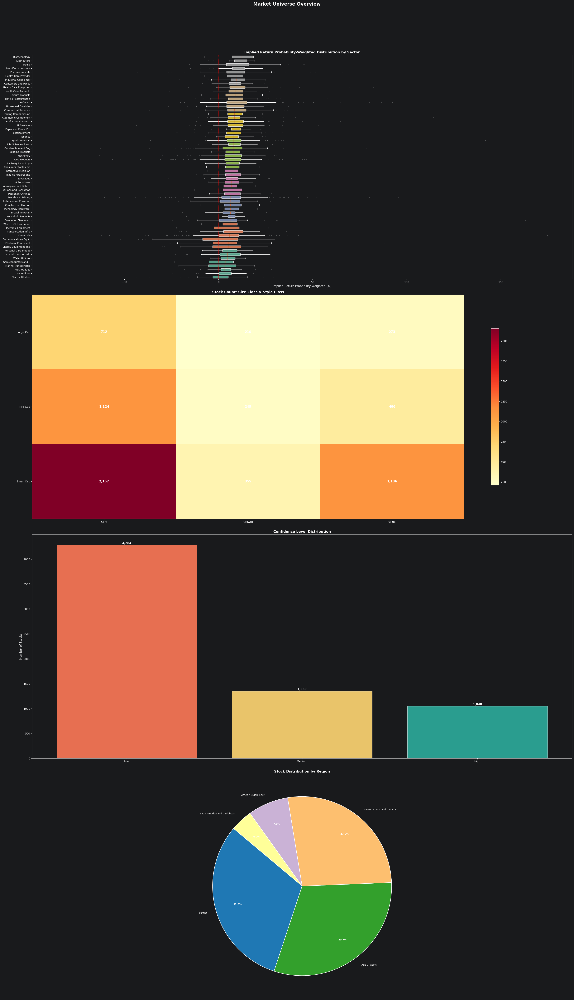

In [8]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(4, 1, figsize=(30, 50))

# Panel 1: Implied Return Probability-Weighted by sector (box plot)
ax1 = axes[0]
sectors_sorted = returns_df.groupby('industry')['implied_return_pt'].median().sort_values().index.tolist()
box_data = [returns_df.loc[returns_df['industry'] == s, 'implied_return_pt'].dropna().clip(-100, 200).values for s in
            sectors_sorted]
bp = ax1.boxplot(box_data, vert=False, patch_artist=True, widths=0.6,
                 flierprops=dict(marker='.', markersize=2, alpha=0.3))
palette = plt.cm.Set2(np.linspace(0, 1, len(sectors_sorted)))
for patch, color in zip(bp['boxes'], palette):
    patch.set_facecolor(color)
    patch.set_alpha(0.8)
ax1.set_yticklabels([s[:20] for s in sectors_sorted], fontsize=9)
ax1.set_xlabel('Implied Return Probability-Weighted (%)', fontsize=11)
ax1.set_title('Implied Return Probability-Weighted Distribution by Sector', fontsize=13, fontweight='bold')
ax1.axvline(0, color='red', linewidth=0.8, linestyle='--', alpha=0.6)
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)

# Panel 2: Size class vs style class heatmap
ax2 = axes[1]
ct = returns_df.groupby(['size_class', 'style_class']).size().unstack(fill_value=0)
im2 = ax2.imshow(ct.values, cmap='YlOrRd', aspect='auto')
ax2.set_xticks(range(ct.shape[1]))
ax2.set_yticks(range(ct.shape[0]))
ax2.set_xticklabels(ct.columns, fontsize=10)
ax2.set_yticklabels(ct.index, fontsize=10)
for i in range(ct.shape[0]):
    for j in range(ct.shape[1]):
        ax2.text(j, i, f'{ct.values[i, j]:,}', ha='center', va='center', fontsize=12, fontweight='bold')
fig.colorbar(im2, ax=ax2, shrink=0.7)
ax2.set_title('Stock Count: Size Class × Style Class', fontsize=13, fontweight='bold')

# Panel 3: Confidence level distribution
ax3 = axes[2]
conf_counts = returns_df['confidence_level'].value_counts()
conf_colors = {'High': '#2A9D8F', 'Medium': '#E9C46A', 'Low': '#E76F51'}
bars3 = ax3.bar(conf_counts.index, conf_counts.values,
                color=[conf_colors.get(c, '#999') for c in conf_counts.index],
                edgecolor='white', linewidth=0.5)
for bar, val in zip(bars3, conf_counts.values):
    ax3.text(bar.get_x() + bar.get_width() / 2, val + 20, f'{val:,}', ha='center', fontsize=11, fontweight='bold')
ax3.set_ylabel('Number of Stocks', fontsize=11)
ax3.set_title('Confidence Level Distribution', fontsize=13, fontweight='bold')
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)

# Panel 4: Region distribution
ax4 = axes[3]
region_counts = returns_df['region'].value_counts()
region_colors = plt.cm.Paired(np.linspace(0.1, 0.9, len(region_counts)))
wedges, texts, autotexts = ax4.pie(region_counts.values, labels=region_counts.index,
                                   autopct='%1.1f%%', colors=region_colors,
                                   startangle=140, pctdistance=0.75,
                                   wedgeprops=dict(edgecolor='white', linewidth=1.5))
for t in autotexts:
    t.set_fontsize(9)
    t.set_fontweight('bold')
for t in texts:
    t.set_fontsize(9)
ax4.set_title('Stock Distribution by Region', fontsize=13, fontweight='bold')

fig.suptitle('Market Universe Overview', fontsize=17, fontweight='bold', y=1.04)
fig.tight_layout()
plt.show()

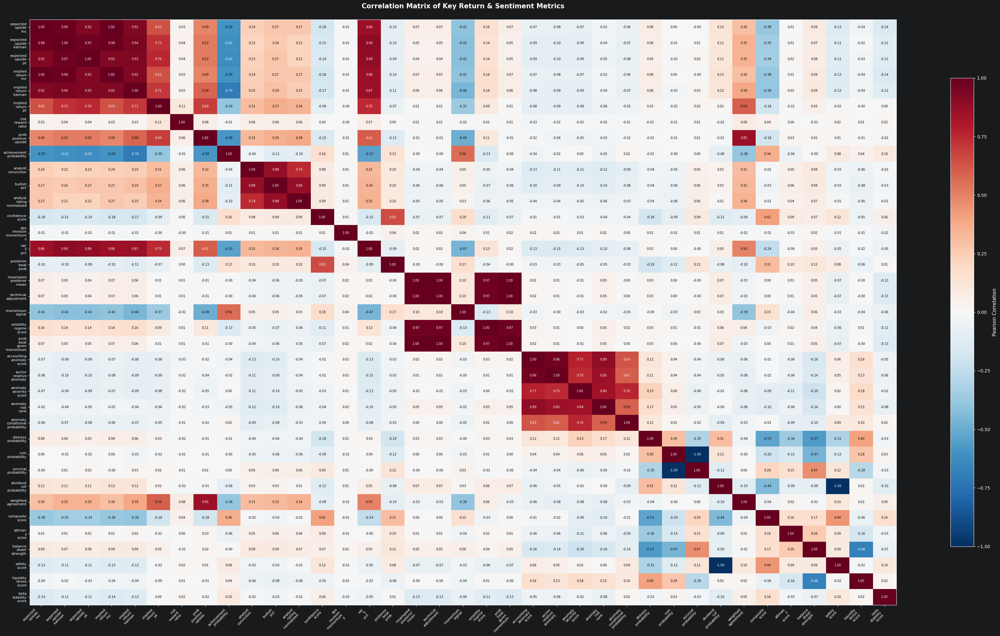

In [9]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(35, 20))

metrics = [
    'expected_upside_mc', 'expected_upside_kalman', 'expected_upside_pt', 'implied_return_mc', 'implied_return_kalman',
    'implied_return_pt',
    'risk_reward_ratio', 'prob_positive_upside', 'achievement_probability',
    'analyst_conviction', 'bullish_pct', 'analyst_rating_normalized', 'confidence_score',
    'eps_revision_momentum_y', 'var_5_pct', "posterior_beat_prob", 'resampled_posterior_mean',
    'technical_adjustment', 'momentum_signal', 'volatility_regime_score', 'prob_beat_given_momentum',
    'accounting_anomaly_score',
    'sector_relative_anomaly', 'anomaly_severity_score', 'anomaly_risk_rank', 'anomaly_conditional_probability',
    'distress_probability', 'ruin_probability', 'survival_probability', 'dividend_cut_probability',
    'weighted_agreement', 'composite_score',
    'altman_z_score', 'balance_sheet_strength', 'safety_score',
    'liquidity_stress_score', 'beta_stability_score'
]
available = [m for m in metrics if m in returns_df.columns]
corr_matrix = returns_df[available].corr()

labels = [m.replace('_', '\n') for m in available]
im = ax.imshow(corr_matrix.values, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')

ax.set_xticks(range(len(available)))
ax.set_yticks(range(len(available)))
ax.set_xticklabels(labels, fontsize=8, rotation=45, ha='right')
ax.set_yticklabels(labels, fontsize=8)

for i in range(len(available)):
    for j in range(len(available)):
        val = corr_matrix.values[i, j]
        text_color = 'white' if abs(val) > 0.6 else 'black'
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', fontsize=7, color=text_color)

cbar = fig.colorbar(im, ax=ax, shrink=0.8)
cbar.set_label('Pearson Correlation', fontsize=11)
ax.set_title('Correlation Matrix of Key Return & Sentiment Metrics', fontsize=15, fontweight='bold', pad=25)
fig.tight_layout()
plt.show()

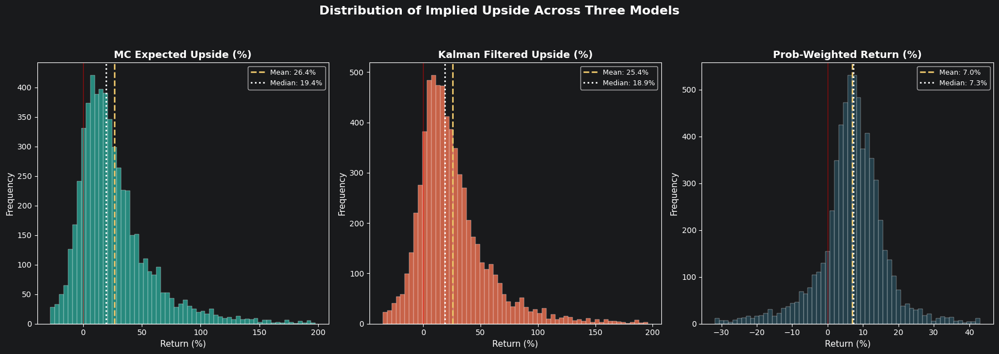

In [10]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

metrics = ['implied_return_mc', 'implied_return_kalman', 'implied_return_pt']
titles = ['MC Expected Upside (%)', 'Kalman Filtered Upside (%)', 'Prob-Weighted Return (%)']
colors_list = ['#2A9D8F', '#E76F51', '#264653']

for ax, metric, title, color in zip(axes, metrics, titles, colors_list):
    data = returns_df[metric].dropna()
    lower, upper = data.quantile(0.01), data.quantile(0.99)
    clipped = data[(data >= lower) & (data <= upper)]

    ax.hist(clipped, bins=60, color=color, alpha=0.85, edgecolor='white', linewidth=0.3)
    mean_val = clipped.mean()
    median_val = clipped.median()
    ax.axvline(mean_val, color='#E9C46A', linewidth=2, linestyle='--', label=f'Mean: {mean_val:.1f}%')
    ax.axvline(median_val, color='white', linewidth=2, linestyle=':', label=f'Median: {median_val:.1f}%')
    ax.axvline(0, color='red', linewidth=1, linestyle='-', alpha=0.5)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xlabel('Return (%)', fontsize=11)
    ax.set_ylabel('Frequency', fontsize=11)
    ax.legend(fontsize=9, loc='upper right')
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)

fig.suptitle('Distribution of Implied Upside Across Three Models', fontsize=16, fontweight='bold', y=1.05)
fig.tight_layout()
plt.show()

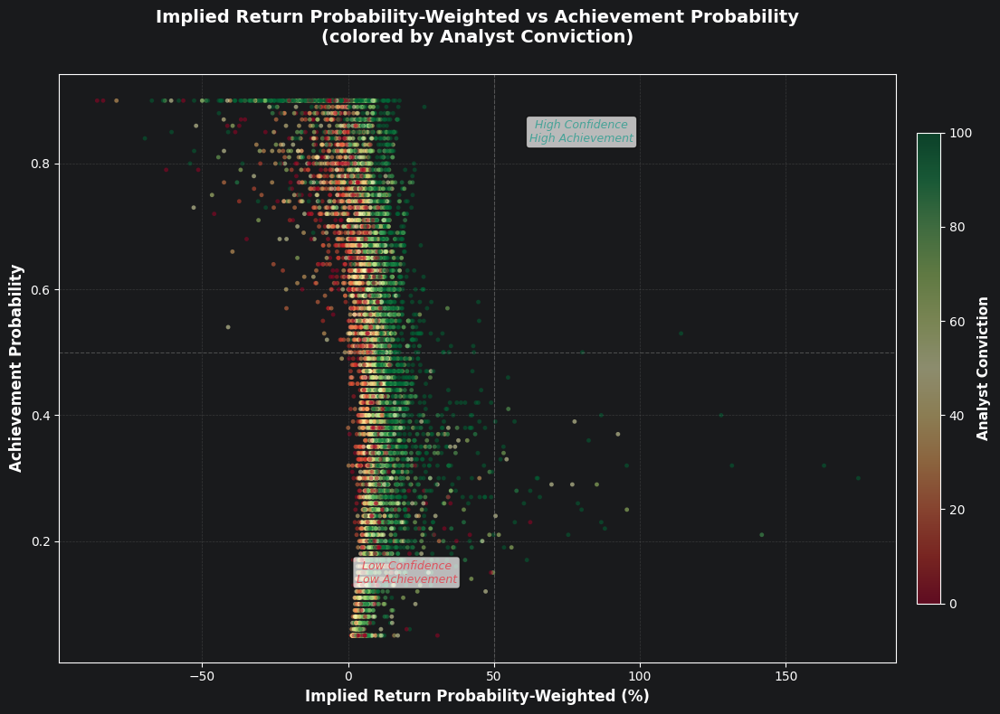

In [11]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 8))
prob_pos = returns_df['implied_return_pt'].dropna()
achieve = returns_df['achievement_probability'].dropna()
common_idx = prob_pos.index.intersection(achieve.index)
x = prob_pos.loc[common_idx]
y = achieve.loc[common_idx]
conviction = returns_df.loc[common_idx, 'analyst_conviction'].fillna(50)

sc = ax.scatter(x, y, c=conviction, cmap='RdYlGn', s=12, alpha=0.5,
                edgecolors='none', vmin=0, vmax=100)
cbar = plt.colorbar(sc, ax=ax, shrink=0.8, pad=0.02)
cbar.set_label('Analyst Conviction', fontsize=11, fontweight='bold')

ax.axvline(50, color='gray', linewidth=0.8, linestyle='--', alpha=0.5)
ax.axhline(0.5, color='gray', linewidth=0.8, linestyle='--', alpha=0.5)
ax.set_xlabel('Implied Return Probability-Weighted (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Achievement Probability', fontsize=12, fontweight='bold')
ax.set_title('Implied Return Probability-Weighted vs Achievement Probability\n(colored by Analyst Conviction)',
             fontsize=14, fontweight='bold', pad=25)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.grid(alpha=0.2, linestyle='--')

# Annotate quadrants
ax.text(80, 0.85, 'High Confidence\nHigh Achievement', ha='center', va='center',
        fontsize=9, color='#2A9D8F', fontstyle='italic', alpha=0.8,
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))
ax.text(20, 0.15, 'Low Confidence\nLow Achievement', ha='center', va='center',
        fontsize=9, color='#E63946', fontstyle='italic', alpha=0.8,
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))
plt.tight_layout()
plt.show()

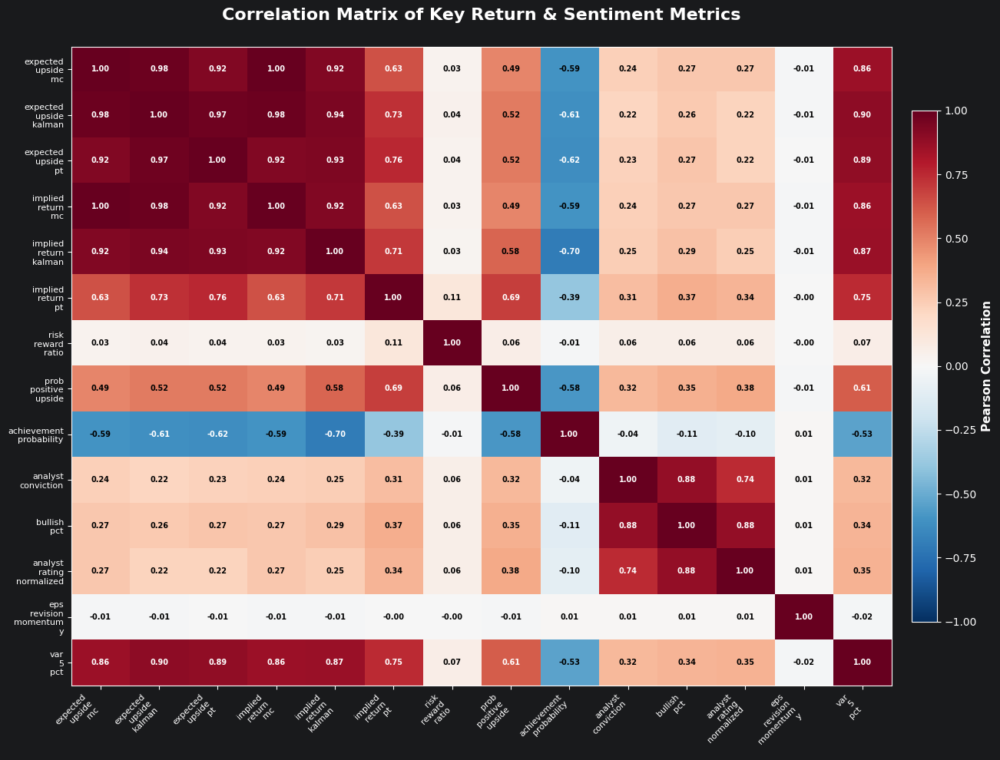

In [12]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(14, 10))

metrics = ['expected_upside_mc', 'expected_upside_kalman', 'expected_upside_pt', 'implied_return_mc',
           'implied_return_kalman', 'implied_return_pt',
           'risk_reward_ratio', 'prob_positive_upside', 'achievement_probability',
           'analyst_conviction', 'bullish_pct', 'analyst_rating_normalized',
           'eps_revision_momentum_y', 'var_5_pct']
selected = ['expected_upside_mc', 'expected_upside_kalman', 'expected_upside_pt', 'implied_return_mc',
            'implied_return_kalman', 'implied_return_pt',
            'risk_reward_ratio', 'prob_positive_upside', 'achievement_probability',
            'analyst_conviction', 'bullish_pct', 'analyst_rating_normalized',
            'eps_revision_momentum_y', 'var_5_pct']
available = [c for c in selected if c in returns_df.columns]
corr_data = returns_df[available].corr()

im = ax.imshow(corr_data.values, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
cbar = plt.colorbar(im, ax=ax, shrink=0.8, pad=0.02)
cbar.set_label('Pearson Correlation', fontsize=11, fontweight='bold')

labels = [c.replace('_', '\n') for c in corr_data.columns]
ax.set_xticks(range(len(labels)))
ax.set_yticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(labels, fontsize=8)

for i in range(len(corr_data)):
    for j in range(len(corr_data)):
        val = corr_data.iloc[i, j]
        text_color = 'white' if abs(val) > 0.6 else 'black'
        ax.text(j, i, f'{val:.2f}', ha='center', va='center',
                fontsize=7, color=text_color, fontweight='bold')

ax.set_title('Correlation Matrix of Key Return & Sentiment Metrics',
             fontsize=16, fontweight='bold', pad=25)
plt.tight_layout()
plt.show()

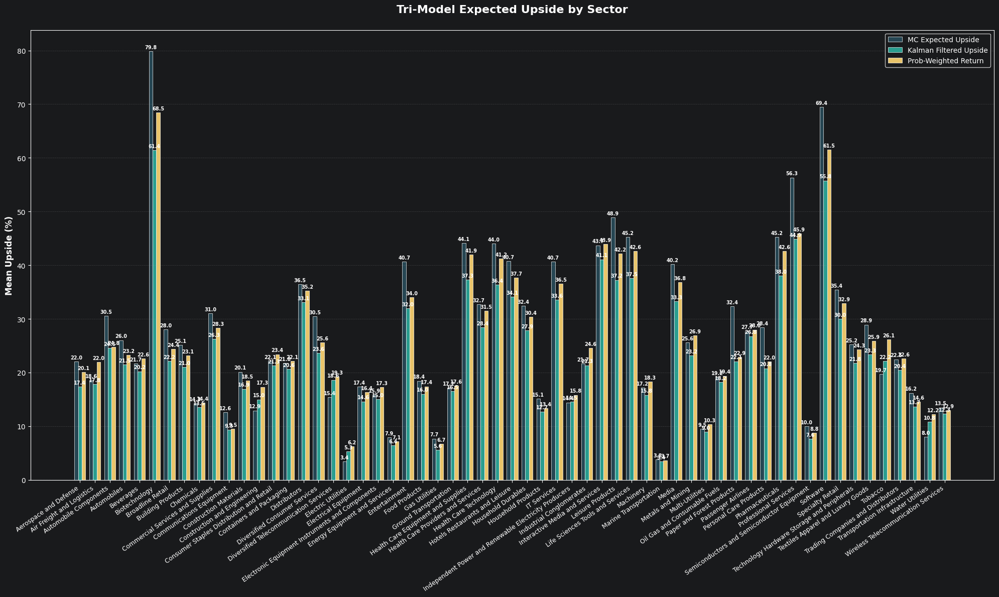

In [13]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(20, 12))
sectors = sorted(returns_df['industry'].unique())
metrics = ['expected_upside_mc', 'expected_upside_kalman', 'expected_upside_pt']
metric_labels = ['MC Expected Upside', 'Kalman Filtered Upside', 'Prob-Weighted Return']
x = np.arange(len(sectors))
width = 0.25
colors = ['#264653', '#2A9D8F', '#E9C46A']

for i, (metric, label, color) in enumerate(zip(metrics, metric_labels, colors)):
    means = [returns_df.loc[returns_df['industry'] == s, metric].mean() for s in sectors]
    bars = ax.bar(x + i * width, means, width, label=label, color=color, edgecolor='white', linewidth=0.5)
    for bar, val in zip(bars, means):
        if not np.isnan(val):
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
                    f'{val:.1f}', ha='center', va='bottom', fontsize=7, fontweight='bold')

ax.set_xticks(x + width)
ax.set_xticklabels(sectors, rotation=35, ha='right', fontsize=9)
ax.set_ylabel('Mean Upside (%)', fontsize=12, fontweight='bold')
ax.set_title('Tri-Model Expected Upside by Sector', fontsize=16, fontweight='bold', pad=25)
ax.legend(fontsize=10, loc='upper right', framealpha=0.9)
ax.axhline(0, color='gray', linewidth=0.8, linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.grid(axis='y', alpha=0.25, linestyle='--')
plt.tight_layout()
plt.show()

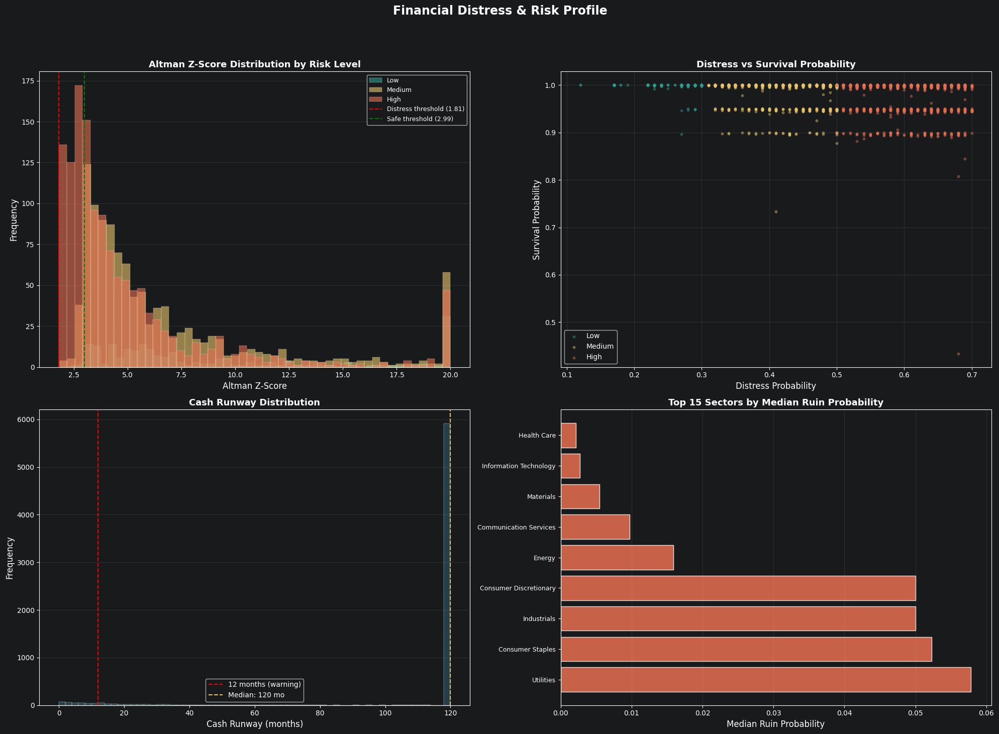

In [14]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(20, 14))
fig.suptitle('Financial Distress & Risk Profile', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Altman Z-Score distribution colored by risk_level
ax1 = axes[0, 0]
risk_levels = ['Low', 'Medium', 'High']
risk_colors = {'Low': '#2A9D8F', 'Medium': '#E9C46A', 'High': '#E76F51'}
for rl in risk_levels:
    subset = returns_df.loc[returns_df['risk_level'] == rl, 'altman_z_score'].dropna().clip(-5, 20)
    if len(subset) > 0:
        ax1.hist(subset, bins=50, alpha=0.6, label=rl, color=risk_colors.get(rl, '#999'),
                 edgecolor='white', linewidth=0.3)
ax1.axvline(1.81, color='red', linestyle='--', linewidth=1.5, label='Distress threshold (1.81)')
ax1.axvline(2.99, color='green', linestyle='--', linewidth=1.5, label='Safe threshold (2.99)')
ax1.set_xlabel('Altman Z-Score', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('Altman Z-Score Distribution by Risk Level', fontsize=13, fontweight='bold')
ax1.legend(fontsize=9)
ax1.grid(axis='y', alpha=0.2)

# Panel 2: Distress probability vs survival probability scatter
ax2 = axes[0, 1]
valid_risk = returns_df[['distress_probability', 'survival_probability', 'risk_level']].dropna()
for rl in risk_levels:
    subset = valid_risk[valid_risk['risk_level'] == rl]
    ax2.scatter(subset['distress_probability'], subset['survival_probability'],
                c=risk_colors.get(rl, '#999'), s=10, alpha=0.4, label=rl)
ax2.set_xlabel('Distress Probability', fontsize=12)
ax2.set_ylabel('Survival Probability', fontsize=12)
ax2.set_title('Distress vs Survival Probability', fontsize=13, fontweight='bold')
ax2.legend(fontsize=10)
ax2.grid(alpha=0.2)

# Panel 3: Cash runway months histogram
ax3 = axes[1, 0]
cash_data = returns_df['cash_runway_months'].dropna().clip(0, 120)
ax3.hist(cash_data, bins=60, color='#264653', alpha=0.85, edgecolor='white', linewidth=0.3)
ax3.axvline(12, color='red', linestyle='--', linewidth=1.5, label='12 months (warning)')
ax3.axvline(cash_data.median(), color='#E9C46A', linestyle='--', linewidth=1.5,
            label=f'Median: {cash_data.median():.0f} mo')
ax3.set_xlabel('Cash Runway (months)', fontsize=12)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title('Cash Runway Distribution', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.grid(axis='y', alpha=0.2)

# Panel 4: Ruin probability by sector (top 15 sectors by median ruin prob)
ax4 = axes[1, 1]
ruin_by_sector = returns_df.groupby('sector')['ruin_probability'].median().dropna().sort_values(ascending=False).head(
    15)
ax4.barh(range(len(ruin_by_sector)), ruin_by_sector.values, color='#E76F51', alpha=0.85, edgecolor='white')
ax4.set_yticks(range(len(ruin_by_sector)))
ax4.set_yticklabels(ruin_by_sector.index, fontsize=9)
ax4.set_xlabel('Median Ruin Probability', fontsize=12)
ax4.set_title('Top 15 Sectors by Median Ruin Probability', fontsize=13, fontweight='bold')
ax4.grid(axis='x', alpha=0.2)

plt.tight_layout()
plt.show()

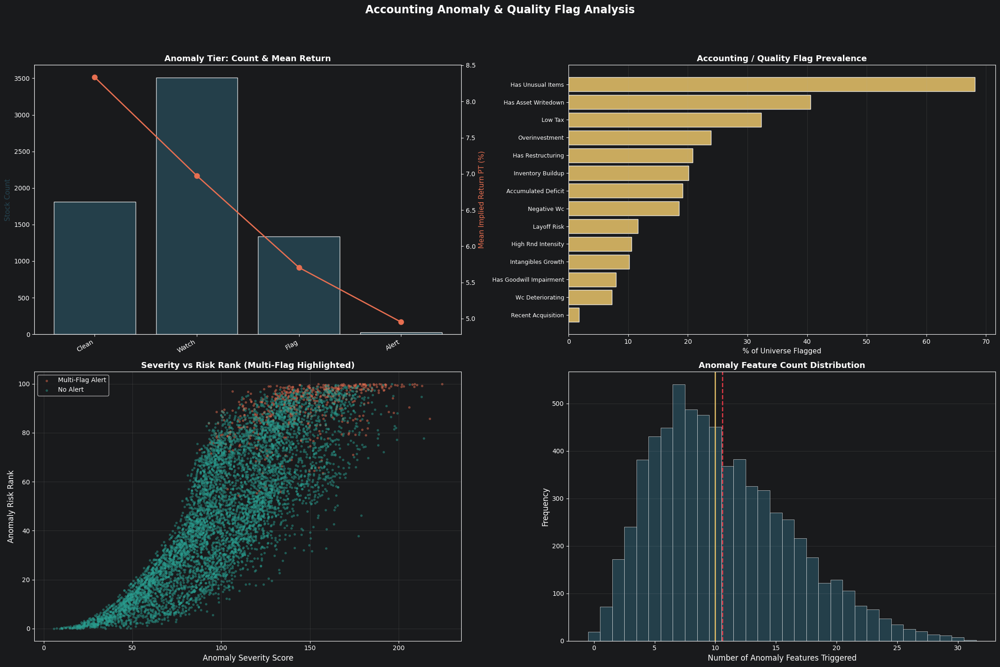

In [15]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(22, 14))
fig.suptitle('Accounting Anomaly & Quality Flag Analysis', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Anomaly tier breakdown with mean implied return overlay
ax1 = axes[0, 0]
tier_order = returns_df.groupby('accounting_anomaly_tier')[
    'accounting_anomaly_score'].median().sort_values().index.tolist()
tier_counts = returns_df['accounting_anomaly_tier'].value_counts().reindex(tier_order)
tier_returns = returns_df.groupby('accounting_anomaly_tier')['implied_return_pt'].mean().reindex(tier_order)

bars = ax1.bar(range(len(tier_order)), tier_counts.values, color='#264653', alpha=0.85, edgecolor='white')
ax1.set_xticks(range(len(tier_order)))
ax1.set_xticklabels(tier_order, fontsize=10, rotation=30, ha='right')
ax1.set_ylabel('Stock Count', fontsize=11, color='#264653')
ax1_twin = ax1.twinx()
ax1_twin.plot(range(len(tier_order)), tier_returns.values, 'o-', color='#E76F51', linewidth=2, markersize=8)
ax1_twin.set_ylabel('Mean Implied Return PT (%)', fontsize=11, color='#E76F51')
ax1.set_title('Anomaly Tier: Count & Mean Return', fontsize=13, fontweight='bold')

# Panel 2: Quality flag frequency heatmap
ax2 = axes[0, 1]
flag_cols = [
    'accumulated_deficit_flag', 'negative_wc_flag', 'wc_deteriorating_flag',
    'intangibles_growth_flag', 'inventory_buildup_flag', 'has_goodwill_impairment',
    'has_asset_writedown', 'has_restructuring', 'overinvestment_flag',
    'recent_acquisition_flag', 'high_rnd_intensity_flag', 'has_unusual_items_flag',
    'low_tax_flag', 'layoff_risk_flag'
]
available_flags = [f for f in flag_cols if f in returns_df.columns]
flag_rates = returns_df[available_flags].mean().sort_values(ascending=True)
flag_labels = [f.replace('_flag', '').replace('_', ' ').title() for f in flag_rates.index]

ax2.barh(range(len(flag_rates)), flag_rates.values * 100, color='#E9C46A', edgecolor='white', alpha=0.85)
ax2.set_yticks(range(len(flag_rates)))
ax2.set_yticklabels(flag_labels, fontsize=9)
ax2.set_xlabel('% of Universe Flagged', fontsize=11)
ax2.set_title('Accounting / Quality Flag Prevalence', fontsize=13, fontweight='bold')
ax2.grid(axis='x', alpha=0.2)

# Panel 3: Multi-flag alert vs anomaly severity scatter
ax3 = axes[1, 0]
for mf, color, label in [(True, '#E76F51', 'Multi-Flag Alert'), (False, '#2A9D8F', 'No Alert')]:
    subset = returns_df[returns_df['multi_flag_alert'] == mf]
    ax3.scatter(subset['anomaly_severity_score'], subset['anomaly_risk_rank'],
                c=color, s=8, alpha=0.4, label=label)
ax3.set_xlabel('Anomaly Severity Score', fontsize=12)
ax3.set_ylabel('Anomaly Risk Rank', fontsize=12)
ax3.set_title('Severity vs Risk Rank (Multi-Flag Highlighted)', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.grid(alpha=0.2)

# Panel 4: anomaly_feature_count distribution
ax4 = axes[1, 1]
feat_count = returns_df['anomaly_feature_count'].dropna()
ax4.hist(feat_count, bins=range(0, int(feat_count.max()) + 2), color='#264653',
         alpha=0.85, edgecolor='white', linewidth=0.5, align='left')
ax4.set_xlabel('Number of Anomaly Features Triggered', fontsize=12)
ax4.set_ylabel('Frequency', fontsize=12)
ax4.set_title('Anomaly Feature Count Distribution', fontsize=13, fontweight='bold')
ax4.axvline(feat_count.median(), color='#E9C46A', linestyle='-', linewidth=1.8,
            label=f'Median: {feat_count.median():.2f}')
ax4.axvline(feat_count.mean(), color='#E63946', linestyle='--', linewidth=1.8,
            label=f'Mean: {feat_count.mean():.2f}')
ax4.grid(axis='y', alpha=0.2)

plt.tight_layout()
plt.show()

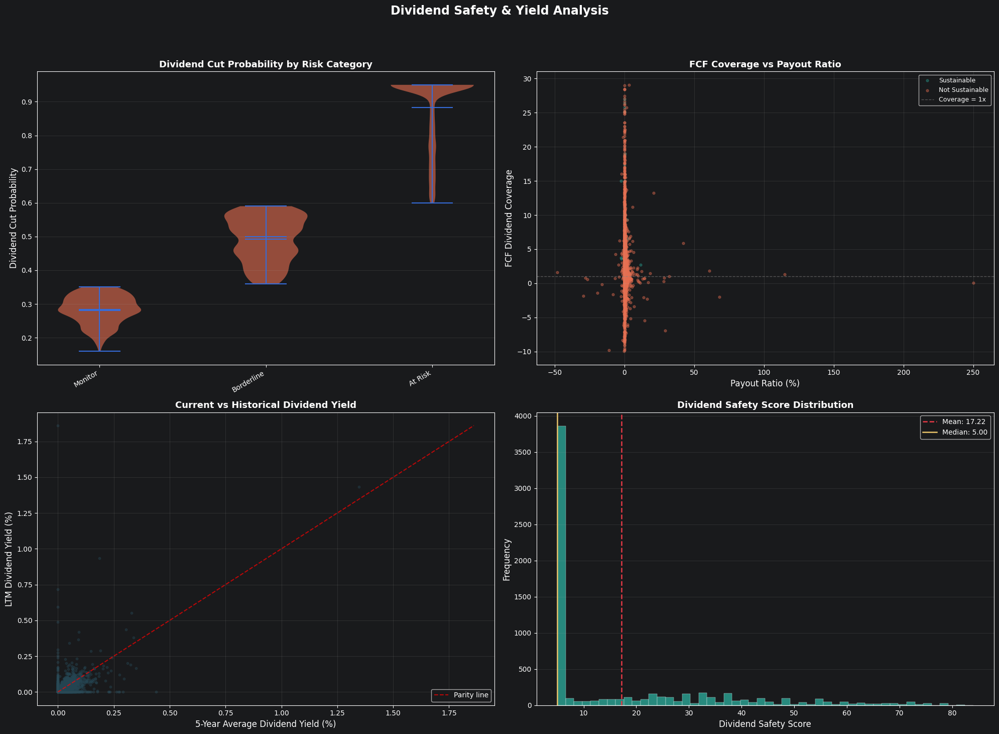

In [16]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(20, 14))
fig.suptitle('Dividend Safety & Yield Analysis', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Dividend cut probability by risk_category
ax1 = axes[0, 0]
risk_cats = returns_df['risk_category'].dropna().unique()
risk_cat_sorted = returns_df.groupby('risk_category')['dividend_cut_probability'].median().sort_values().index.tolist()
div_cut_data = [returns_df.loc[returns_df['risk_category'] == rc, 'dividend_cut_probability'].dropna().values
                for rc in risk_cat_sorted]
vp = ax1.violinplot([d for d in div_cut_data if len(d) > 0],
                    positions=range(len([d for d in div_cut_data if len(d) > 0])),
                    showmeans=True, showmedians=True)
for body in vp['bodies']:
    body.set_facecolor('#E76F51')
    body.set_alpha(0.6)
valid_cats = [rc for rc, d in zip(risk_cat_sorted, div_cut_data) if len(d) > 0]
ax1.set_xticks(range(len(valid_cats)))
ax1.set_xticklabels(valid_cats, fontsize=10, rotation=30, ha='right')
ax1.set_ylabel('Dividend Cut Probability', fontsize=12)
ax1.set_title('Dividend Cut Probability by Risk Category', fontsize=13, fontweight='bold')
ax1.grid(axis='y', alpha=0.2)

# Panel 2: FCF Dividend Coverage vs Payout Ratio
ax2 = axes[0, 1]
div_valid = returns_df[['fcf_dividend_coverage', 'payout_ratio', 'sustainable_flag']].dropna()
div_valid = div_valid[(div_valid['payout_ratio'].between(-50, 300)) &
                      (div_valid['fcf_dividend_coverage'].between(-10, 30))]
for sf, color, label in [(1, '#2A9D8F', 'Sustainable'), (0, '#E76F51', 'Not Sustainable')]:
    sub = div_valid[div_valid['sustainable_flag'] == sf]
    ax2.scatter(sub['payout_ratio'], sub['fcf_dividend_coverage'],
                c=color, s=12, alpha=0.4, label=label)
ax2.axhline(1, color='grey', linestyle='--', linewidth=1, alpha=0.6, label='Coverage = 1x')
ax2.set_xlabel('Payout Ratio (%)', fontsize=12)
ax2.set_ylabel('FCF Dividend Coverage', fontsize=12)
ax2.set_title('FCF Coverage vs Payout Ratio', fontsize=13, fontweight='bold')
ax2.legend(fontsize=9)
ax2.grid(alpha=0.2)

# Panel 3: Current yield vs 5-year avg yield
ax3 = axes[1, 0]
yield_valid = returns_df[['div_yield_ltm', 'div_yield_5y_avg']].dropna()
yield_valid = yield_valid[(yield_valid['div_yield_ltm'].between(0, 15)) &
                          (yield_valid['div_yield_5y_avg'].between(0, 15))]
ax3.scatter(yield_valid['div_yield_5y_avg'], yield_valid['div_yield_ltm'],
            c='#264653', s=10, alpha=0.4)
lims = [0, max(yield_valid['div_yield_ltm'].max(), yield_valid['div_yield_5y_avg'].max())]
ax3.plot(lims, lims, '--', color='red', linewidth=1.5, alpha=0.7, label='Parity line')
ax3.set_xlabel('5-Year Average Dividend Yield (%)', fontsize=12)
ax3.set_ylabel('LTM Dividend Yield (%)', fontsize=12)
ax3.set_title('Current vs Historical Dividend Yield', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.grid(alpha=0.2)

# Panel 4: Safety score distribution
ax4 = axes[1, 1]
safety = returns_df['safety_score'].dropna()
ax4.hist(safety, bins=50, color='#2A9D8F', alpha=0.85, edgecolor='white', linewidth=0.3)
ax4.axvline(safety.mean(), color='#E63946', linestyle='--', linewidth=1.8,
            label=f'Mean: {safety.mean():.2f}')
ax4.axvline(safety.median(), color='#E9C46A', linestyle='-', linewidth=1.8,
            label=f'Median: {safety.median():.2f}')
ax4.set_xlabel('Dividend Safety Score', fontsize=12)
ax4.set_ylabel('Frequency', fontsize=12)
ax4.set_title('Dividend Safety Score Distribution', fontsize=13, fontweight='bold')
ax4.legend(fontsize=10)
ax4.grid(axis='y', alpha=0.2)

plt.tight_layout()
plt.show()

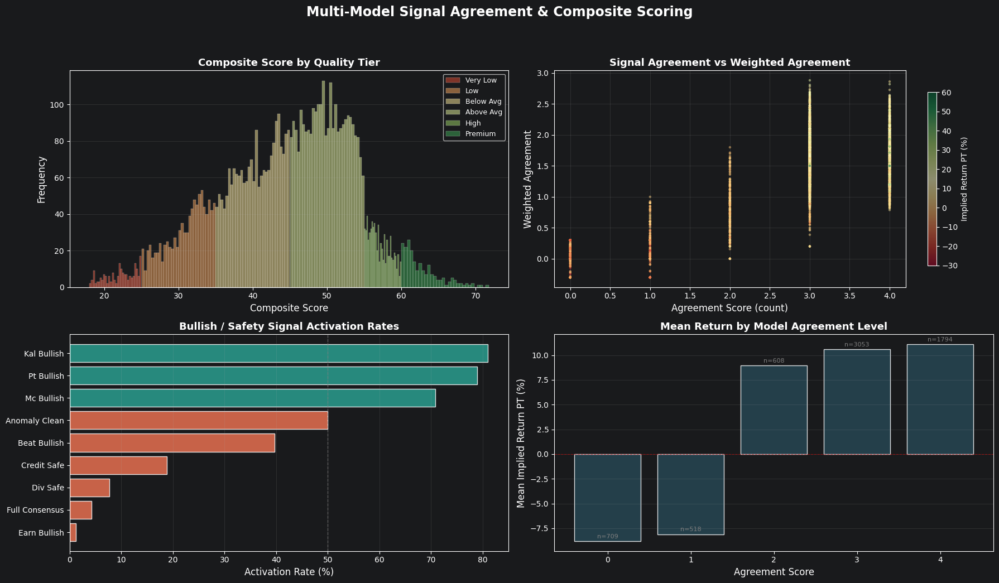

In [17]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(18, 10))
fig.suptitle('Multi-Model Signal Agreement & Composite Scoring', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Composite score distribution by quality_tier
ax1 = axes[0, 0]
tiers = returns_df['quality_tier'].dropna().unique()
tier_sorted = returns_df.groupby('quality_tier')['composite_score'].median().sort_values().index.tolist()
tier_colors = plt.cm.RdYlGn(np.linspace(0.15, 0.85, len(tier_sorted)))
for tier, color in zip(tier_sorted, tier_colors):
    subset = returns_df.loc[returns_df['quality_tier'] == tier, 'composite_score'].dropna()
    ax1.hist(subset, bins=30, alpha=0.5, label=tier, color=color, edgecolor='white', linewidth=0.3)
ax1.set_xlabel('Composite Score', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('Composite Score by Quality Tier', fontsize=13, fontweight='bold')
ax1.legend(fontsize=9)
ax1.grid(axis='y', alpha=0.2)

# Panel 2: Agreement score vs weighted agreement vs implied return
ax2 = axes[0, 1]
agree_data = returns_df[['agreement_score', 'weighted_agreement', 'implied_return_pt']].dropna()
sc = ax2.scatter(agree_data['agreement_score'], agree_data['weighted_agreement'],
                 c=agree_data['implied_return_pt'].clip(-30, 60), cmap='RdYlGn',
                 s=10, alpha=0.5, edgecolors='none')
plt.colorbar(sc, ax=ax2, shrink=0.8, label='Implied Return PT (%)')
ax2.set_xlabel('Agreement Score (count)', fontsize=12)
ax2.set_ylabel('Weighted Agreement', fontsize=12)
ax2.set_title('Signal Agreement vs Weighted Agreement', fontsize=13, fontweight='bold')
ax2.grid(alpha=0.2)

# Panel 3: Boolean signal activation rates
ax3 = axes[1, 0]
bool_signals = ['mc_bullish', 'kal_bullish', 'pt_bullish', 'earn_bullish',
                'beat_bullish', 'credit_safe', 'div_safe', 'anomaly_clean', 'full_consensus']
avail_bools = [b for b in bool_signals if b in returns_df.columns]
activation_rates = returns_df[avail_bools].mean().sort_values(ascending=True)
signal_labels = [s.replace('_', ' ').title() for s in activation_rates.index]
colors = ['#2A9D8F' if v >= 0.5 else '#E76F51' for v in activation_rates.values]
ax3.barh(range(len(activation_rates)), activation_rates.values * 100, color=colors,
         edgecolor='white', alpha=0.85)
ax3.set_yticks(range(len(activation_rates)))
ax3.set_yticklabels(signal_labels, fontsize=10)
ax3.set_xlabel('Activation Rate (%)', fontsize=12)
ax3.set_title('Bullish / Safety Signal Activation Rates', fontsize=13, fontweight='bold')
ax3.axvline(50, color='grey', linestyle='--', linewidth=1, alpha=0.6)
ax3.grid(axis='x', alpha=0.2)

# Panel 4: Mean implied return by agreement_score bucket
ax4 = axes[1, 1]
agree_grp = returns_df.groupby('agreement_score').agg(
    mean_return=('implied_return_pt', 'mean'),
    count=('implied_return_pt', 'size')
).reset_index()
ax4.bar(agree_grp['agreement_score'], agree_grp['mean_return'], color='#264653',
        edgecolor='white', alpha=0.85)
for _, row in agree_grp.iterrows():
    ax4.text(row['agreement_score'], row['mean_return'] + 0.3,
             f'n={int(row["count"])}', ha='center', fontsize=8, color='grey')
ax4.set_xlabel('Agreement Score', fontsize=12)
ax4.set_ylabel('Mean Implied Return PT (%)', fontsize=12)
ax4.set_title('Mean Return by Model Agreement Level', fontsize=13, fontweight='bold')
ax4.axhline(0, color='red', linestyle='--', linewidth=0.8, alpha=0.5)
ax4.grid(axis='y', alpha=0.2)

plt.tight_layout()
plt.show()

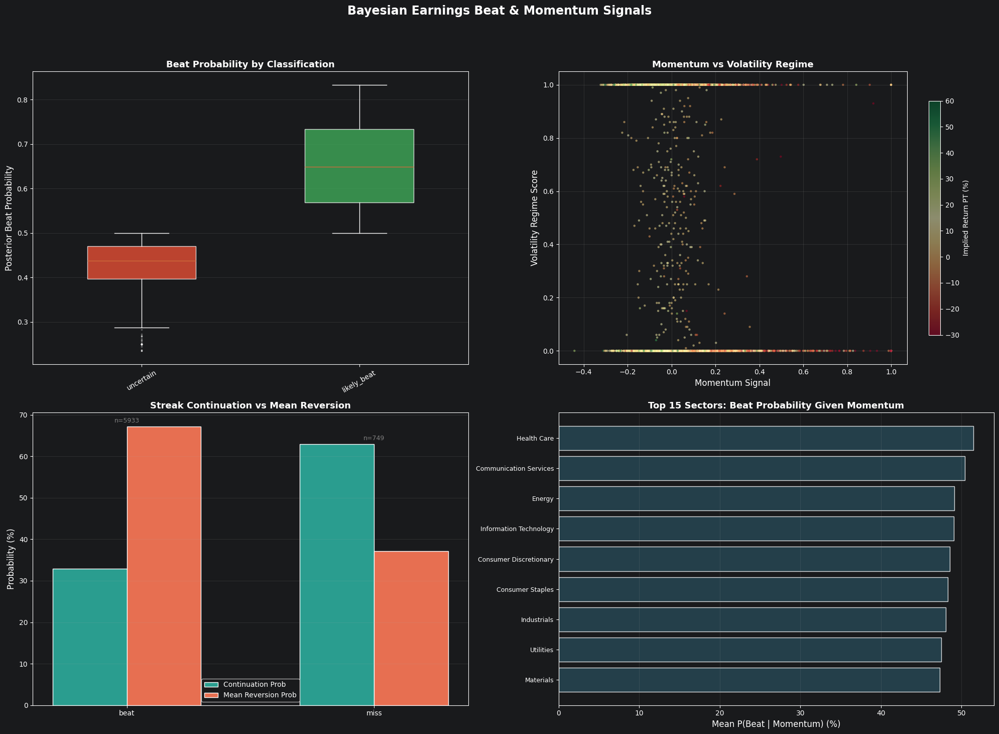

In [18]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(20, 14))
fig.suptitle('Bayesian Earnings Beat & Momentum Signals', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Posterior beat probability by beat_classification
ax1 = axes[0, 0]
beat_classes = returns_df['beat_classification'].dropna().unique()
bc_sorted = returns_df.groupby('beat_classification')['posterior_beat_prob'].median().sort_values().index.tolist()
bc_data = [returns_df.loc[returns_df['beat_classification'] == bc, 'posterior_beat_prob'].dropna().values
           for bc in bc_sorted]
bp = ax1.boxplot(bc_data, tick_labels=bc_sorted, patch_artist=True, widths=0.5,
                 flierprops=dict(marker='.', markersize=3, alpha=0.3))
box_colors = plt.cm.RdYlGn(np.linspace(0.15, 0.85, len(bc_sorted)))
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.8)
ax1.set_ylabel('Posterior Beat Probability', fontsize=12)
ax1.set_title('Beat Probability by Classification', fontsize=13, fontweight='bold')
ax1.tick_params(axis='x', rotation=30)
ax1.grid(axis='y', alpha=0.2)

# Panel 2: Momentum signal vs volatility regime score
ax2 = axes[0, 1]
mom_data = returns_df[['momentum_signal', 'volatility_regime_score', 'implied_return_pt']].dropna()
sc = ax2.scatter(mom_data['momentum_signal'], mom_data['volatility_regime_score'],
                 c=mom_data['implied_return_pt'].clip(-30, 60), cmap='RdYlGn',
                 s=10, alpha=0.5, edgecolors='none')
plt.colorbar(sc, ax=ax2, shrink=0.8, label='Implied Return PT (%)')
ax2.set_xlabel('Momentum Signal', fontsize=12)
ax2.set_ylabel('Volatility Regime Score', fontsize=12)
ax2.set_title('Momentum vs Volatility Regime', fontsize=13, fontweight='bold')
ax2.grid(alpha=0.2)

# Panel 3: Streak type distribution with continuation probability
ax3 = axes[1, 0]
streak_data = returns_df.groupby('streak_type').agg(
    count=('ticker', 'size'),
    mean_continuation=('continuation_probability', 'mean'),
    mean_reversion=('mean_reversion_probability', 'mean')
).reset_index()
x_pos = np.arange(len(streak_data))
ax3.bar(x_pos - 0.15, streak_data['mean_continuation'] * 100, 0.3,
        label='Continuation Prob', color='#2A9D8F', edgecolor='white')
ax3.bar(x_pos + 0.15, streak_data['mean_reversion'] * 100, 0.3,
        label='Mean Reversion Prob', color='#E76F51', edgecolor='white')
ax3.set_xticks(x_pos)
ax3.set_xticklabels(streak_data['streak_type'], fontsize=10)
for i, row in streak_data.iterrows():
    ax3.text(i, max(row['mean_continuation'], row['mean_reversion']) * 100 + 1,
             f'n={row["count"]}', ha='center', fontsize=9, color='grey')
ax3.set_ylabel('Probability (%)', fontsize=12)
ax3.set_title('Streak Continuation vs Mean Reversion', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.grid(axis='y', alpha=0.2)

# Panel 4: Prob of beat given momentum across sectors (top 15)
ax4 = axes[1, 1]
sector_beat = returns_df.groupby('sector')['prob_beat_given_momentum'].mean().dropna().sort_values(ascending=True).tail(
    15)
ax4.barh(range(len(sector_beat)), sector_beat.values * 100, color='#264653', edgecolor='white', alpha=0.85)
ax4.set_yticks(range(len(sector_beat)))
ax4.set_yticklabels(sector_beat.index, fontsize=9)
ax4.set_xlabel('Mean P(Beat | Momentum) (%)', fontsize=12)
ax4.set_title('Top 15 Sectors: Beat Probability Given Momentum', fontsize=13, fontweight='bold')
ax4.grid(axis='x', alpha=0.2)

plt.tight_layout()
plt.show()

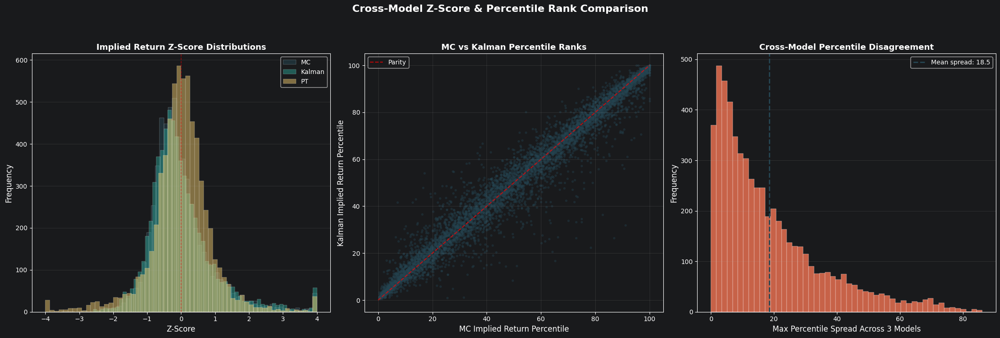

In [19]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(22, 7))
fig.suptitle('Cross-Model Z-Score & Percentile Rank Comparison', fontsize=16, fontweight='bold', y=1.05)

# Panel 1: Z-score distributions overlay
ax1 = axes[0]
zscore_cols = ['implied_return_mc_zscore', 'implied_return_kalman_zscore', 'implied_return_pt_zscore']
zscore_labels = ['MC', 'Kalman', 'PT']
zscore_colors = ['#264653', '#2A9D8F', '#E9C46A']
for col, label, color in zip(zscore_cols, zscore_labels, zscore_colors):
    data = returns_df[col].dropna().clip(-4, 4)
    ax1.hist(data, bins=60, alpha=0.5, label=label, color=color, edgecolor='white', linewidth=0.3)
ax1.axvline(0, color='red', linestyle='--', linewidth=1, alpha=0.6)
ax1.set_xlabel('Z-Score', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('Implied Return Z-Score Distributions', fontsize=13, fontweight='bold')
ax1.legend(fontsize=10)
ax1.grid(axis='y', alpha=0.2)

# Panel 2: MC percentile vs Kalman percentile scatter
ax2 = axes[1]
pctile_data = returns_df[['implied_return_mc_pctile', 'implied_return_kalman_pctile']].dropna()
ax2.scatter(pctile_data['implied_return_mc_pctile'], pctile_data['implied_return_kalman_pctile'],
            c='#264653', s=8, alpha=0.3)
ax2.plot([0, 100], [0, 100], '--', color='red', linewidth=1.5, alpha=0.7, label='Parity')
ax2.set_xlabel('MC Implied Return Percentile', fontsize=12)
ax2.set_ylabel('Kalman Implied Return Percentile', fontsize=12)
ax2.set_title('MC vs Kalman Percentile Ranks', fontsize=13, fontweight='bold')
ax2.legend(fontsize=10)
ax2.grid(alpha=0.2)

# Panel 3: Model agreement — difference in percentile ranks
ax3 = axes[2]
pctile_all = returns_df[['implied_return_mc_pctile', 'implied_return_kalman_pctile',
                         'implied_return_pt_pctile']].dropna()
pctile_range = pctile_all.max(axis=1) - pctile_all.min(axis=1)
ax3.hist(pctile_range, bins=50, color='#E76F51', alpha=0.85, edgecolor='white', linewidth=0.3)
ax3.axvline(pctile_range.mean(), color='#264653', linestyle='--', linewidth=2,
            label=f'Mean spread: {pctile_range.mean():.1f}')
ax3.set_xlabel('Max Percentile Spread Across 3 Models', fontsize=12)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title('Cross-Model Percentile Disagreement', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.grid(axis='y', alpha=0.2)

plt.tight_layout()
plt.show()

In [20]:
import plotly.graph_objects as go
import numpy as np

# Prepare data — drop rows where any of the three implied return columns is NaN
scatter_cols = ['implied_return_mc', 'implied_return_kalman', 'implied_return_pt']
hover_cols = ['sector', 'ticker', 'name', 'industry', 'country',
              'trading_country', 'exchange', 'market_cap', 'last_price', 'price_target',
              'price_target_mc', 'price_target_kalman', 'price_target_prob_weighted', 'signal']
plot_df = returns_df[scatter_cols + hover_cols].dropna(subset=scatter_cols).copy()

# Clip extreme outliers for cleaner visualization (1st–99th percentile)
for col in scatter_cols:
    lo, hi = plot_df[col].quantile(0.01), plot_df[col].quantile(0.99)
    plot_df[col] = plot_df[col].clip(lo, hi)

# Color by sector
sectors = sorted(plot_df['industry'].dropna().unique())
color_map = {s: i for i, s in enumerate(sectors)}
plot_df['industry_code'] = plot_df['industry'].map(color_map)

fig = go.Figure()

for sector in sectors:
    subset = plot_df[plot_df['industry'] == sector]
    fig.add_trace(go.Scatter3d(
        x=subset['implied_return_mc'],
        y=subset['implied_return_kalman'],
        z=subset['implied_return_pt'],
        mode='markers',
        name=sector,
        marker=dict(size=3, opacity=0.6),
        text=subset.apply(
            lambda r: (
                f"<b>{r['ticker']}</b> — {r['name']}<br>"
                f"<b>Sector:</b> {r['sector']}<br>"
                f"<b>Industry:</b> {r['industry']}<br>"
                f"<b>Country:</b> {r['country']} | "
                f"<b>Trading:</b> {r['trading_country']}<br>"
                f"<b>Exchange:</b> {r['exchange']}<br>"
                f"<b>Market Cap:</b> {r['market_cap']:,.0f}<br>"
                f"<b>Last Price:</b> {r['last_price']:.2f} | "
                f"<b>Consensus PT:</b> {r['price_target']:.2f}<br>"
                f"<b>MC:</b> {r['implied_return_mc']:.2f}% "
                f"(PT: {r['price_target_mc']:.2f})<br>"
                f"<b>Kalman:</b> {r['implied_return_kalman']:.2f}% "
                f"(PT: {r['price_target_kalman']:.2f})<br>"
                f"<b>PT Weighted:</b> {r['implied_return_pt']:.2f}% "
                f"(PT: {r['price_target_prob_weighted']:.2f})<br>"
                f"<b>Signal:</b> {r['signal']}<br>"
            ), axis=1
        ),
        hoverinfo='text'
    ))

# Add a diagonal parity line (where all three models agree)
# Derive range from the intersection of all three axis ranges
axis_min = max(plot_df['implied_return_mc'].min(),
               plot_df['implied_return_kalman'].min(),
               plot_df['implied_return_pt'].min())
axis_max = min(plot_df['implied_return_mc'].max(),
               plot_df['implied_return_kalman'].max(),
               plot_df['implied_return_pt'].max())
diag_vals = np.linspace(axis_min, axis_max, 100)
fig.add_trace(go.Scatter3d(
    x=diag_vals, y=diag_vals, z=diag_vals,
    mode='lines',
    name='Perfect Agreement',
    line=dict(color='red', width=4, dash='dash'),
    hoverinfo='skip'
))

fig.update_layout(
    title=dict(
        text='Multi-Model Implied Return Distribution (MC vs Kalman vs PT)',
        font=dict(size=18, family='Arial', color='#E0E0E0'),
        x=0.5
    ),
    paper_bgcolor='#1a1a2e',
    plot_bgcolor='#1a1a2e',
    font=dict(color='#E0E0E0'),
    scene=dict(
        xaxis_title='Implied Return MC (%)',
        yaxis_title='Implied Return Kalman (%)',
        zaxis_title='Implied Return PT (%)',
        xaxis=dict(backgroundcolor='#16213e', gridcolor='#2a2a4a',
                   color='#E0E0E0', zerolinecolor='#4a4a6a'),
        yaxis=dict(backgroundcolor='#16213e', gridcolor='#2a2a4a',
                   color='#E0E0E0', zerolinecolor='#4a4a6a'),
        zaxis=dict(backgroundcolor='#16213e', gridcolor='#2a2a4a',
                   color='#E0E0E0', zerolinecolor='#4a4a6a'),
        bgcolor='#0f3460',
    ),
    legend=dict(
        title=dict(text='Sector', font=dict(color='#E0E0E0', size=12)),
        font=dict(size=10, color='#C0C0C0'),
        bgcolor='rgba(22, 33, 62, 0.85)',
        bordercolor='#2a2a4a',
        borderwidth=1,
        itemsizing='constant',
        tracegroupgap=2,
        yanchor='top', y=0.95,
        xanchor='left', x=1.02
    ),
    hoverlabel=dict(
        bgcolor='#16213e',
        font_size=11,
        font_family='Consolas, monospace',
        font_color='#E0E0E0',
        bordercolor='#4a4a6a'
    ),
    width=1800,
    height=1000,
    margin=dict(l=20, r=20, t=100, b=20),
)

fig.show()

**Valuation & Forward Growth Metrics**


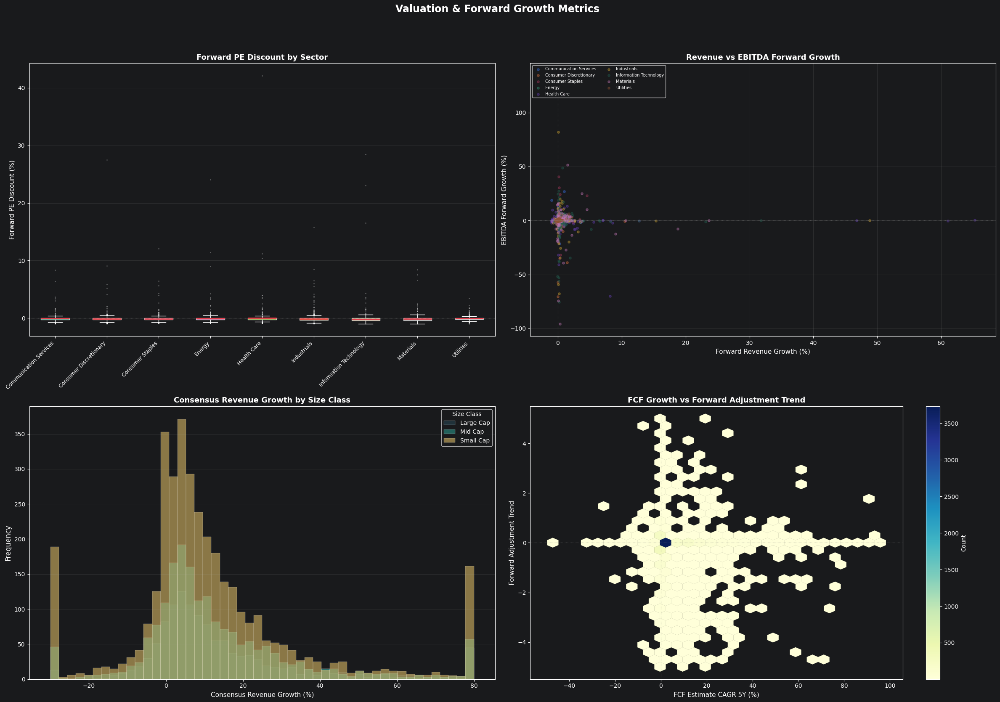

In [21]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(24, 16))
fig.suptitle('Valuation & Forward Growth Metrics', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Forward PE Discount distribution by sector
ax1 = axes[0, 0]
sectors = sorted(returns_df['sector'].dropna().unique())
pe_data = [returns_df.loc[returns_df['sector'] == s, 'pe_forward_discount'].dropna().clip(-100, 100).values
           for s in sectors]
bp1 = ax1.boxplot(pe_data, vert=True, patch_artist=True, widths=0.55,
                  medianprops=dict(color='#E63946', linewidth=2),
                  flierprops=dict(marker='.', markersize=2, alpha=0.3))
palette = plt.cm.Set2(np.linspace(0, 1, len(sectors)))
for patch, c in zip(bp1['boxes'], palette):
    patch.set_facecolor(c)
    patch.set_alpha(0.75)
ax1.set_xticklabels(sectors, rotation=45, ha='right', fontsize=9)
ax1.axhline(0, color='grey', linestyle=':', linewidth=0.8)
ax1.set_ylabel('Forward PE Discount (%)', fontsize=11)
ax1.set_title('Forward PE Discount by Sector', fontsize=13, fontweight='bold')
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.grid(axis='y', alpha=0.2)

# Panel 2: Forward Revenue Growth vs EBITDA Forward Growth scatter
ax2 = axes[0, 1]
valid = returns_df[['forward_revenue_growth', 'ebitda_forward_growth', 'sector']].dropna()
valid = valid[(valid['forward_revenue_growth'].between(-50, 100)) &
              (valid['ebitda_forward_growth'].between(-100, 200))]
for s in sectors:
    sub = valid[valid['sector'] == s]
    ax2.scatter(sub['forward_revenue_growth'], sub['ebitda_forward_growth'],
                alpha=0.4, s=15, label=s)
ax2.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax2.axvline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax2.set_xlabel('Forward Revenue Growth (%)', fontsize=11)
ax2.set_ylabel('EBITDA Forward Growth (%)', fontsize=11)
ax2.set_title('Revenue vs EBITDA Forward Growth', fontsize=13, fontweight='bold')
ax2.legend(fontsize=7, ncol=2, loc='upper left')
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)
ax2.grid(alpha=0.2)

# Panel 3: Consensus Revenue Growth by size class
ax3 = axes[1, 0]
size_classes = ['Large Cap', 'Mid Cap', 'Small Cap']
size_colors = {'Large Cap': '#264653', 'Mid Cap': '#2A9D8F', 'Small Cap': '#E9C46A'}
for sc in size_classes:
    vals = returns_df.loc[returns_df['size_class'] == sc, 'consensus_revenue_growth'].dropna().clip(-30, 80)
    ax3.hist(vals, bins=50, alpha=0.55, label=sc, color=size_colors.get(sc, '#999'),
             edgecolor='white', linewidth=0.3)
ax3.set_xlabel('Consensus Revenue Growth (%)', fontsize=11)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title('Consensus Revenue Growth by Size Class', fontsize=13, fontweight='bold')
ax3.legend(title='Size Class', fontsize=10)
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)
ax3.grid(axis='y', alpha=0.2)

# Panel 4: FCF Estimate CAGR 5Y vs Forward Adjustment Trend
ax4 = axes[1, 1]
valid2 = returns_df[['fcf_est_cagr_5y', 'forward_adjustment_trend']].dropna()
valid2 = valid2[(valid2['fcf_est_cagr_5y'].between(-50, 100)) &
                (valid2['forward_adjustment_trend'].between(-5, 5))]
hb = ax4.hexbin(valid2['fcf_est_cagr_5y'], valid2['forward_adjustment_trend'],
                gridsize=30, cmap='YlGnBu', mincnt=1, linewidths=0.2)
plt.colorbar(hb, ax=ax4, label='Count')
ax4.set_xlabel('FCF Estimate CAGR 5Y (%)', fontsize=11)
ax4.set_ylabel('Forward Adjustment Trend', fontsize=11)
ax4.set_title('FCF Growth vs Forward Adjustment Trend', fontsize=13, fontweight='bold')
ax4.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax4.axvline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax4.spines['top'].set_visible(True)
ax4.spines['right'].set_visible(True)

plt.tight_layout()
plt.show()


**Price Momentum & Technical Signals**


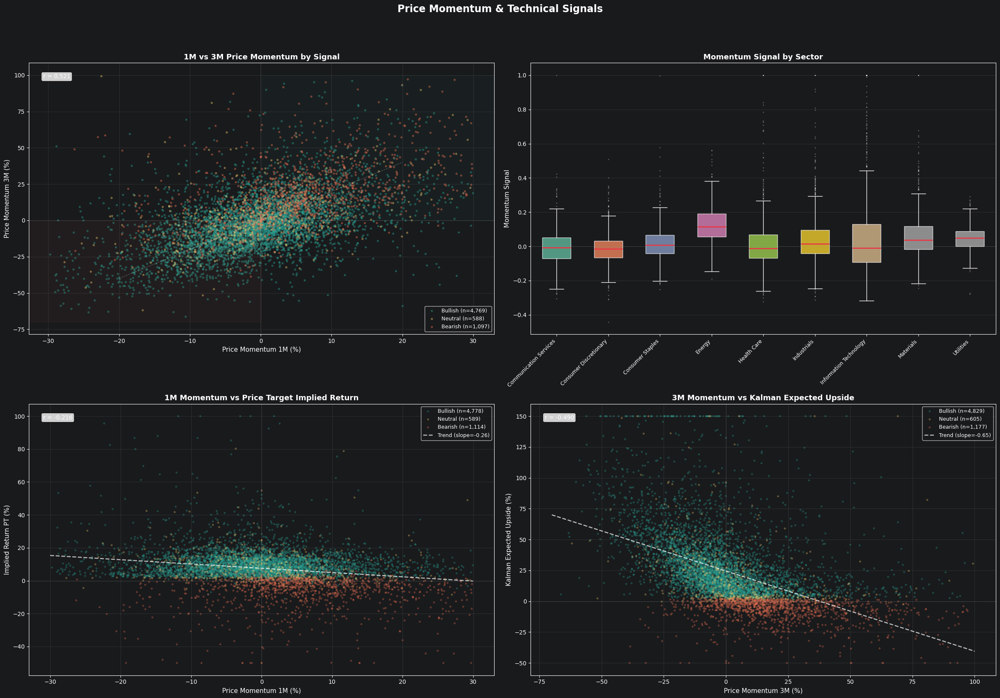

In [22]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

fig, axes = plt.subplots(2, 2, figsize=(24, 16))
fig.suptitle('Price Momentum & Technical Signals', fontsize=17, fontweight='bold', y=1.04)

# --- Panel 1: 1M vs 3M price momentum scatter (FIXED: partial-match signal mapping) ---
ax1 = axes[0, 0]
valid = returns_df[['price_momentum_1m', 'price_momentum_3m', 'signal']].dropna()
valid = valid[
    (valid['price_momentum_1m'].between(-30, 30)) &
    (valid['price_momentum_3m'].between(-70, 100))
    ].copy()


# Map granular signals (e.g. 'Strong Bullish (4/4)') to broad categories
def map_signal(s):
    sl = str(s).lower()
    if 'strong bullish' in sl or 'bullish' in sl:
        return 'Bullish'
    elif 'strong bearish' in sl or 'bearish' in sl:
        return 'Bearish'
    return 'Neutral'


valid['signal_broad'] = valid['signal'].apply(map_signal)

signal_colors = {'Bullish': '#2A9D8F', 'Bearish': '#E76F51', 'Neutral': '#E9C46A'}
signal_order = ['Bullish', 'Neutral', 'Bearish']
for sig in signal_order:
    sub = valid[valid['signal_broad'] == sig]
    ax1.scatter(
        sub['price_momentum_1m'], sub['price_momentum_3m'],
        alpha=0.45, s=14, color=signal_colors[sig],
        label=f'{sig} (n={len(sub):,})', edgecolors='none'
    )

# Momentum quadrant shading
ax1.axhspan(0, 100, xmin=0.5, xmax=1.0, color='#2A9D8F', alpha=0.04)  # strong bullish
ax1.axhspan(-70, 0, xmin=0.0, xmax=0.5, color='#E76F51', alpha=0.04)  # strong bearish
ax1.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax1.axvline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)

# Diagonal momentum consistency line
lim = 20
ax1.plot([-lim, lim], [-lim * 2, lim * 2], color='white', linewidth=0.8,
         linestyle='--', alpha=0.3, label='_nolegend_')

# Pearson r annotation
r, p = pearsonr(valid['price_momentum_1m'], valid['price_momentum_3m'])
ax1.text(0.03, 0.96, f'r = {r:.3f}', transform=ax1.transAxes, fontsize=10,
         va='top', bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

ax1.set_xlabel('Price Momentum 1M (%)', fontsize=11)
ax1.set_ylabel('Price Momentum 3M (%)', fontsize=11)
ax1.set_title('1M vs 3M Price Momentum by Signal', fontsize=13, fontweight='bold')
ax1.legend(fontsize=9, framealpha=0.85)
ax1.spines[['top', 'right']].set_visible(True)
ax1.grid(alpha=0.2)

# --- Panel 2: Momentum signal distribution by sector (existing) ---
ax2 = axes[0, 1]
sectors = sorted(returns_df['sector'].dropna().unique())
mom_data = [returns_df.loc[returns_df['sector'] == s, 'momentum_signal'].dropna().values
            for s in sectors]
bp2 = ax2.boxplot(mom_data, vert=True, patch_artist=True, widths=0.55,
                  medianprops=dict(color='#E63946', linewidth=2),
                  flierprops=dict(marker='.', markersize=2, alpha=0.3))
palette = plt.cm.Set2(np.linspace(0, 1, len(sectors)))
for patch, c in zip(bp2['boxes'], palette):
    patch.set_facecolor(c)
    patch.set_alpha(0.75)
ax2.set_xticklabels(sectors, rotation=45, ha='right', fontsize=9)
ax2.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax2.set_ylabel('Momentum Signal', fontsize=11)
ax2.set_title('Momentum Signal by Sector', fontsize=13, fontweight='bold')
ax2.spines[['top', 'right']].set_visible(True)
ax2.grid(axis='y', alpha=0.2)

# --- Panel 3: 1M Price Momentum vs Implied Return PT (price target convergence) ---
ax3 = axes[1, 0]
pt_mom = returns_df[['price_momentum_1m', 'implied_return_pt', 'signal']].dropna().copy()
pt_mom = pt_mom[pt_mom['price_momentum_1m'].between(-30, 30)]
pt_mom['signal_broad'] = pt_mom['signal'].apply(map_signal)

for sig in signal_order:
    sub = pt_mom[pt_mom['signal_broad'] == sig]
    ax3.scatter(
        sub['price_momentum_1m'], sub['implied_return_pt'].clip(-50, 100),
        alpha=0.35, s=12, color=signal_colors[sig],
        label=f'{sig} (n={len(sub):,})', edgecolors='none'
    )

# Regression line
x_fit = pt_mom['price_momentum_1m'].values
y_fit = pt_mom['implied_return_pt'].clip(-50, 100).values
m, b = np.polyfit(x_fit, y_fit, 1)
x_line = np.linspace(-30, 30, 200)
ax3.plot(x_line, m * x_line + b, color='white', linewidth=1.8,
         linestyle='--', alpha=0.7, label=f'Trend (slope={m:.2f})')

r3, _ = pearsonr(x_fit, y_fit)
ax3.text(0.03, 0.96, f'r = {r3:.3f}', transform=ax3.transAxes, fontsize=10,
         va='top', bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

ax3.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax3.axvline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax3.set_xlabel('Price Momentum 1M (%)', fontsize=11)
ax3.set_ylabel('Implied Return PT (%)', fontsize=11)
ax3.set_title('1M Momentum vs Price Target Implied Return', fontsize=13, fontweight='bold')
ax3.legend(fontsize=9, framealpha=0.85)
ax3.spines[['top', 'right']].set_visible(True)
ax3.grid(alpha=0.2)

# --- Panel 4: 3M Price Momentum vs Kalman Expected Upside ---
ax4 = axes[1, 1]
kal_mom = returns_df[['price_momentum_3m', 'expected_upside_kalman', 'signal']].dropna().copy()
kal_mom = kal_mom[kal_mom['price_momentum_3m'].between(-70, 100)]
kal_mom['signal_broad'] = kal_mom['signal'].apply(map_signal)

for sig in signal_order:
    sub = kal_mom[kal_mom['signal_broad'] == sig]
    ax4.scatter(
        sub['price_momentum_3m'], sub['expected_upside_kalman'].clip(-50, 150),
        alpha=0.35, s=12, color=signal_colors[sig],
        label=f'{sig} (n={len(sub):,})', edgecolors='none'
    )

x_fit4 = kal_mom['price_momentum_3m'].values
y_fit4 = kal_mom['expected_upside_kalman'].clip(-50, 150).values
m4, b4 = np.polyfit(x_fit4, y_fit4, 1)
x_line4 = np.linspace(-70, 100, 200)
ax4.plot(x_line4, m4 * x_line4 + b4, color='white', linewidth=1.8,
         linestyle='--', alpha=0.7, label=f'Trend (slope={m4:.2f})')

r4, _ = pearsonr(x_fit4, y_fit4)
ax4.text(0.03, 0.96, f'r = {r4:.3f}', transform=ax4.transAxes, fontsize=10,
         va='top', bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

ax4.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax4.axvline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax4.set_xlabel('Price Momentum 3M (%)', fontsize=11)
ax4.set_ylabel('Kalman Expected Upside (%)', fontsize=11)
ax4.set_title('3M Momentum vs Kalman Expected Upside', fontsize=13, fontweight='bold')
ax4.legend(fontsize=9, framealpha=0.85)
ax4.spines[['top', 'right']].set_visible(True)
ax4.grid(alpha=0.2)

plt.tight_layout()
plt.show()

**Credit Risk & Balance Sheet Deep Dive**


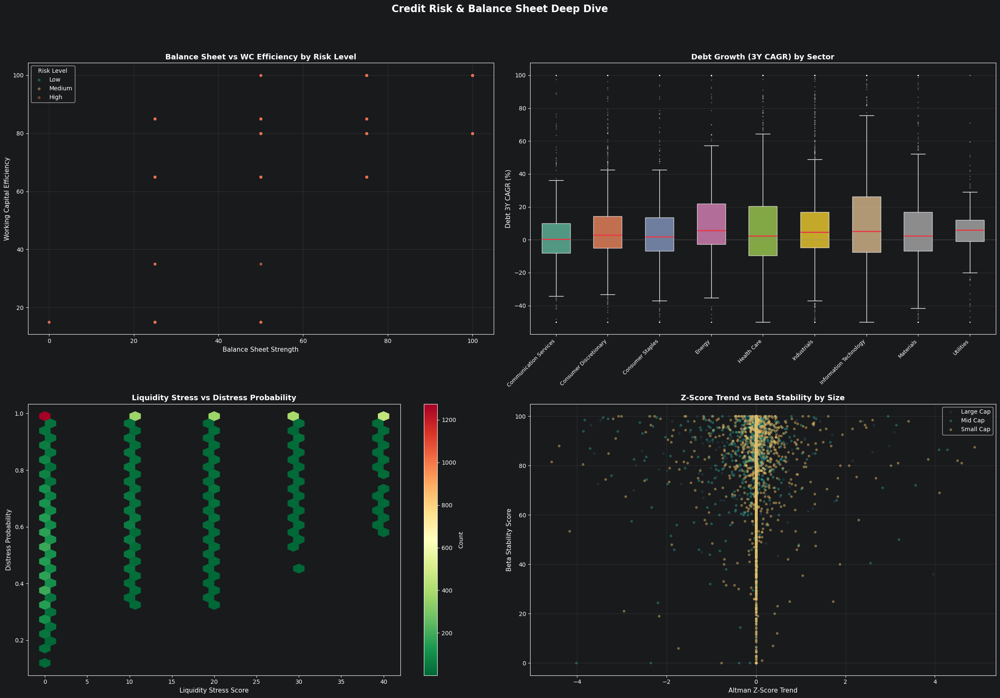

In [23]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(24, 16))
fig.suptitle('Credit Risk & Balance Sheet Deep Dive', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Balance sheet strength vs WC efficiency by risk level
ax1 = axes[0, 0]
valid = returns_df[['balance_sheet_strength', 'wc_efficiency_score', 'risk_level']].dropna()
risk_colors = {'Low': '#2A9D8F', 'Medium': '#E9C46A', 'High': '#E76F51', 'Critical': '#E63946'}
for rl, color in risk_colors.items():
    sub = valid[valid['risk_level'] == rl]
    if len(sub) > 0:
        ax1.scatter(sub['balance_sheet_strength'], sub['wc_efficiency_score'],
                    alpha=0.4, s=15, color=color, label=rl)
ax1.set_xlabel('Balance Sheet Strength', fontsize=11)
ax1.set_ylabel('Working Capital Efficiency', fontsize=11)
ax1.set_title('Balance Sheet vs WC Efficiency by Risk Level', fontsize=13, fontweight='bold')
ax1.legend(title='Risk Level', fontsize=10)
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.grid(alpha=0.2)

# Panel 2: Debt 3Y CAGR by sector
ax2 = axes[0, 1]
sectors = sorted(returns_df['sector'].dropna().unique())
debt_data = [returns_df.loc[returns_df['sector'] == s, 'debt_3y_cagr'].dropna().clip(-50, 100).values
             for s in sectors]
bp2 = ax2.boxplot(debt_data, vert=True, patch_artist=True, widths=0.55,
                  medianprops=dict(color='#E63946', linewidth=2),
                  flierprops=dict(marker='.', markersize=2, alpha=0.3))
palette = plt.cm.Set2(np.linspace(0, 1, len(sectors)))
for patch, c in zip(bp2['boxes'], palette):
    patch.set_facecolor(c)
    patch.set_alpha(0.75)
ax2.set_xticklabels(sectors, rotation=45, ha='right', fontsize=9)
ax2.axhline(0, color='grey', linestyle=':', linewidth=0.8)
ax2.set_ylabel('Debt 3Y CAGR (%)', fontsize=11)
ax2.set_title('Debt Growth (3Y CAGR) by Sector', fontsize=13, fontweight='bold')
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)
ax2.grid(axis='y', alpha=0.2)

# Panel 3: Liquidity stress score vs distress probability
ax3 = axes[1, 0]
valid2 = returns_df[['liquidity_stress_score', 'distress_probability']].dropna()
hb = ax3.hexbin(valid2['liquidity_stress_score'], valid2['distress_probability'],
                gridsize=30, cmap='RdYlGn_r', mincnt=1, linewidths=0.2)
plt.colorbar(hb, ax=ax3, label='Count')
ax3.set_xlabel('Liquidity Stress Score', fontsize=11)
ax3.set_ylabel('Distress Probability', fontsize=11)
ax3.set_title('Liquidity Stress vs Distress Probability', fontsize=13, fontweight='bold')
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)

# Panel 4: Altman Z-Score trend vs beta stability
ax4 = axes[1, 1]
valid3 = returns_df[['altman_z_trend', 'beta_stability_score', 'size_class']].dropna()
valid3 = valid3[valid3['altman_z_trend'].between(-5, 5)]
size_colors = {'Large Cap': '#264653', 'Mid Cap': '#2A9D8F', 'Small Cap': '#E9C46A'}
for sc, color in size_colors.items():
    sub = valid3[valid3['size_class'] == sc]
    ax4.scatter(sub['altman_z_trend'], sub['beta_stability_score'],
                alpha=0.4, s=12, color=color, label=sc)
ax4.axvline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax4.set_xlabel('Altman Z-Score Trend', fontsize=11)
ax4.set_ylabel('Beta Stability Score', fontsize=11)
ax4.set_title('Z-Score Trend vs Beta Stability by Size', fontsize=13, fontweight='bold')
ax4.legend(fontsize=10)
ax4.spines['top'].set_visible(True)
ax4.spines['right'].set_visible(True)
ax4.grid(alpha=0.2)

plt.tight_layout()
plt.show()


**Price Target Spread & Analyst Consensus**


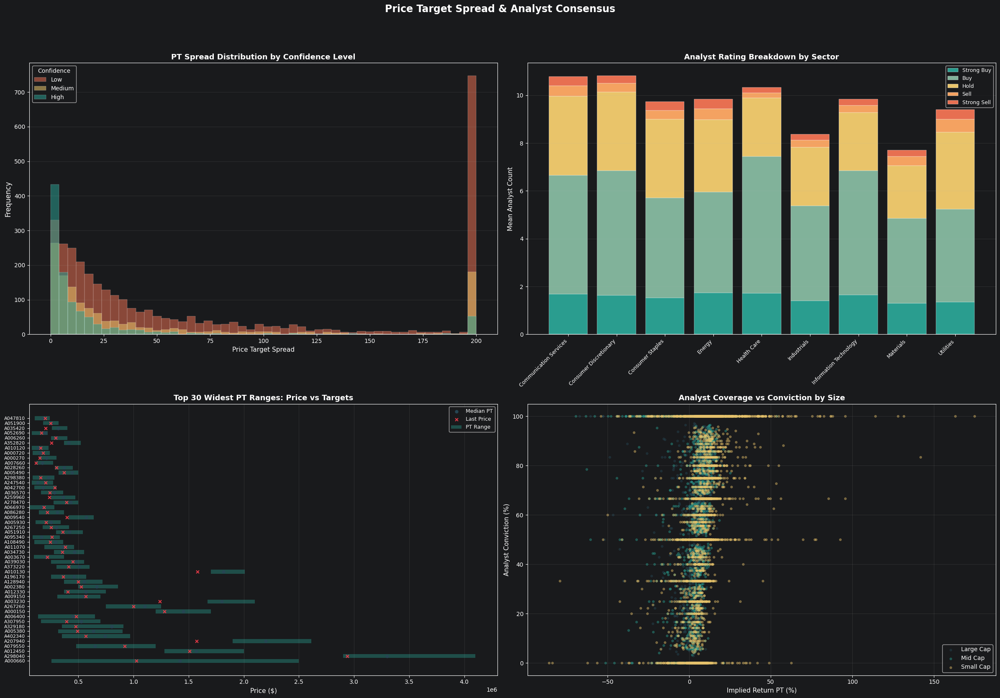

In [24]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(24, 16))
fig.suptitle('Price Target Spread & Analyst Consensus', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: PT spread distribution by confidence level
ax1 = axes[0, 0]
conf_levels = ['Low', 'Medium', 'High']
conf_colors = {'Low': '#E76F51', 'Medium': '#E9C46A', 'High': '#2A9D8F'}
for cl in conf_levels:
    vals = returns_df.loc[returns_df['confidence_level'] == cl, 'pt_spread'].dropna().clip(0, 200)
    ax1.hist(vals, bins=50, alpha=0.55, label=cl, color=conf_colors[cl],
             edgecolor='white', linewidth=0.3)
ax1.set_xlabel('Price Target Spread', fontsize=11)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('PT Spread Distribution by Confidence Level', fontsize=13, fontweight='bold')
ax1.legend(title='Confidence', fontsize=10)
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.grid(axis='y', alpha=0.2)

# Panel 2: Analyst rating breakdown stacked bar by sector
ax2 = axes[0, 1]
sectors = sorted(returns_df['sector'].dropna().unique())
rating_cols = ['num_strong_buys_ratings', 'num_buys_ratings', 'num_hold_ratings',
               'num_sell_ratings', 'num_strong_sell_ratings']
rating_labels = ['Strong Buy', 'Buy', 'Hold', 'Sell', 'Strong Sell']
rating_colors = ['#2A9D8F', '#81B29A', '#E9C46A', '#F4A261', '#E76F51']
x = np.arange(len(sectors))
bottoms = np.zeros(len(sectors))
for col, label, color in zip(rating_cols, rating_labels, rating_colors):
    means = [returns_df.loc[returns_df['sector'] == s, col].mean() for s in sectors]
    ax2.bar(x, means, bottom=bottoms, label=label, color=color, edgecolor='white', linewidth=0.3)
    bottoms += np.array(means)
ax2.set_xticks(x)
ax2.set_xticklabels(sectors, rotation=45, ha='right', fontsize=9)
ax2.set_ylabel('Mean Analyst Count', fontsize=11)
ax2.set_title('Analyst Rating Breakdown by Sector', fontsize=13, fontweight='bold')
ax2.legend(fontsize=9, loc='upper right')
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)
ax2.grid(axis='y', alpha=0.2)

# Panel 3: Price target high/low/median range chart (top 50 by spread)
ax3 = axes[1, 0]
pt_df = returns_df[['ticker', 'last_price', 'price_target_low', 'price_target_median',
                    'price_target_high']].dropna()
pt_df = pt_df.copy()
pt_df['spread'] = pt_df['price_target_high'] - pt_df['price_target_low']
pt_df = pt_df.nlargest(50, 'spread').sort_values('spread', ascending=False)
y = np.arange(len(pt_df))
ax3.barh(y, pt_df['price_target_high'].values - pt_df['price_target_low'].values,
         left=pt_df['price_target_low'].values, color='#2A9D8F', alpha=0.4, label='PT Range')
ax3.set_yticks(y)
ax3.scatter(pt_df['price_target_median'].values, y, color='#264653', s=25, zorder=5, label='Median PT')
ax3.scatter(pt_df['last_price'].values, y, color='#E63946', s=25, zorder=5, marker='x', label='Last Price')
ax3.set_yticks(y)
ax3.set_yticklabels(pt_df['ticker'].values, fontsize=8)
ax3.set_xlabel('Price ($)', fontsize=11)
ax3.set_title('Top 30 Widest PT Ranges: Price vs Targets', fontsize=13, fontweight='bold')
ax3.legend(fontsize=9)
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)
ax3.grid(axis='x', alpha=0.2)

# Panel 4: Price target count vs analyst conviction
ax4 = axes[1, 1]
valid = returns_df[['implied_return_pt', 'analyst_conviction', 'size_class']].dropna()
size_colors = {'Large Cap': '#264653', 'Mid Cap': '#2A9D8F', 'Small Cap': '#E9C46A'}
for sc, color in size_colors.items():
    sub = valid[valid['size_class'] == sc]
    ax4.scatter(sub['implied_return_pt'], sub['analyst_conviction'],
                alpha=0.4, s=12, color=color, label=sc)
ax4.set_xlabel('Implied Return PT (%)', fontsize=11)
ax4.set_ylabel('Analyst Conviction (%)', fontsize=11)
ax4.set_title('Analyst Coverage vs Conviction by Size', fontsize=13, fontweight='bold')
ax4.legend(fontsize=10)
ax4.spines['top'].set_visible(True)
ax4.spines['right'].set_visible(True)
ax4.grid(alpha=0.2)

plt.tight_layout()
plt.show()


**GAAP Revision Trends & Earnings Divergence**


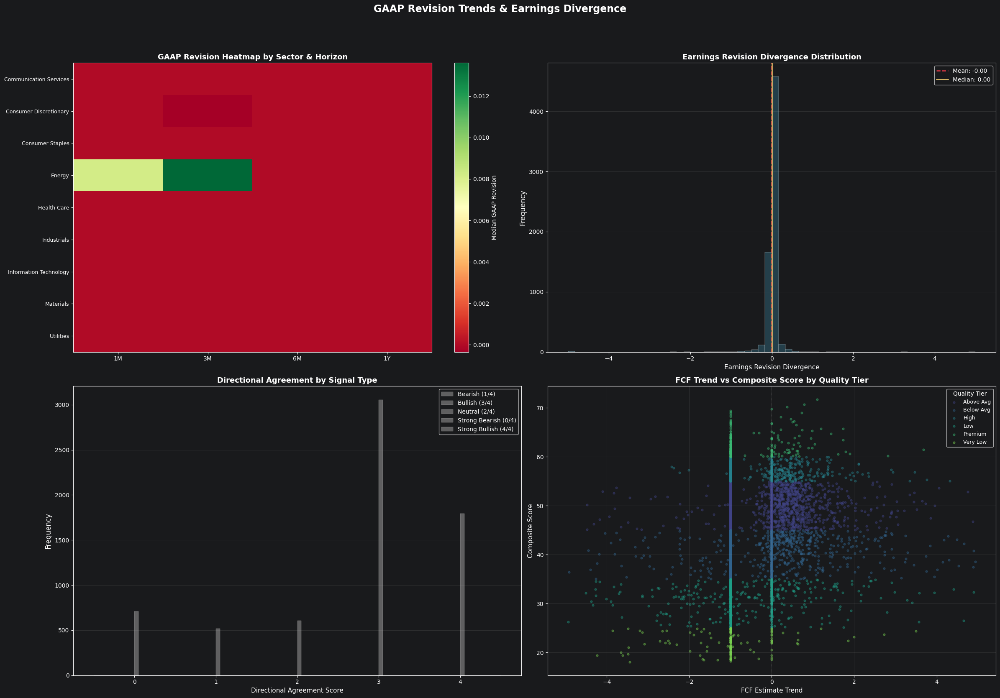

In [25]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(24, 16))
fig.suptitle('GAAP Revision Trends & Earnings Divergence', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: GAAP revision heatmap across time horizons by sector
ax1 = axes[0, 0]
sectors = sorted(returns_df['sector'].dropna().unique())
rev_cols = ['gaap_revision_1m', 'gaap_revision_3m', 'gaap_revision_6m', 'gaap_revision_1y']
rev_labels = ['1M', '3M', '6M', '1Y']
heatmap_data = np.array([[returns_df.loc[returns_df['sector'] == s, c].median()
                          for c in rev_cols] for s in sectors])
im = ax1.imshow(heatmap_data, cmap='RdYlGn', aspect='auto', interpolation='nearest')
ax1.set_xticks(range(len(rev_labels)))
ax1.set_xticklabels(rev_labels, fontsize=10)
ax1.set_yticks(range(len(sectors)))
ax1.set_yticklabels(sectors, fontsize=9)
plt.colorbar(im, ax=ax1, label='Median GAAP Revision')
ax1.set_title('GAAP Revision Heatmap by Sector & Horizon', fontsize=13, fontweight='bold')

# Panel 2: Earnings revision divergence distribution
ax2 = axes[0, 1]
erd = returns_df['earnings_revision_divergence'].dropna().clip(-5, 5)
ax2.hist(erd, bins=60, color='#264653', alpha=0.85, edgecolor='white', linewidth=0.3)
ax2.axvline(erd.mean(), color='#E63946', linestyle='--', linewidth=1.8,
            label=f'Mean: {erd.mean():.2f}')
ax2.axvline(erd.median(), color='#E9C46A', linestyle='-', linewidth=1.8,
            label=f'Median: {erd.median():.2f}')
ax2.set_xlabel('Earnings Revision Divergence', fontsize=11)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Earnings Revision Divergence Distribution', fontsize=13, fontweight='bold')
ax2.legend(fontsize=10)
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)
ax2.grid(axis='y', alpha=0.2)

# Panel 3: Directional agreement distribution by signal
ax3 = axes[1, 0]
signals = sorted(returns_df['signal'].dropna().unique())
signal_colors = {'Bullish': '#2A9D8F', 'Bearish': '#E76F51', 'Neutral': '#E9C46A'}
for sig in signals:
    vals = returns_df.loc[returns_df['signal'] == sig, 'directional_agreement'].dropna()
    ax3.hist(vals, bins=20, alpha=0.55, label=sig,
             color=signal_colors.get(sig, '#999'), edgecolor='white', linewidth=0.3)
ax3.set_xlabel('Directional Agreement Score', fontsize=11)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title('Directional Agreement by Signal Type', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)
ax3.grid(axis='y', alpha=0.2)

# Panel 4: FCF estimate trend vs composite score
ax4 = axes[1, 1]
valid = returns_df[['fcf_est_trend', 'composite_score', 'quality_tier']].dropna()
valid = valid[valid['fcf_est_trend'].between(-5, 5)]
tiers = sorted(valid['quality_tier'].unique())
tier_colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(tiers)))
for tier, color in zip(tiers, tier_colors):
    sub = valid[valid['quality_tier'] == tier]
    ax4.scatter(sub['fcf_est_trend'], sub['composite_score'],
                alpha=0.4, s=12, color=color, label=tier)
ax4.axvline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax4.set_xlabel('FCF Estimate Trend', fontsize=11)
ax4.set_ylabel('Composite Score', fontsize=11)
ax4.set_title('FCF Trend vs Composite Score by Quality Tier', fontsize=13, fontweight='bold')
ax4.legend(fontsize=9, title='Quality Tier')
ax4.spines['top'].set_visible(True)
ax4.spines['right'].set_visible(True)
ax4.grid(alpha=0.2)

plt.tight_layout()
plt.show()


**Dividend Yield Curve & Sustainability**


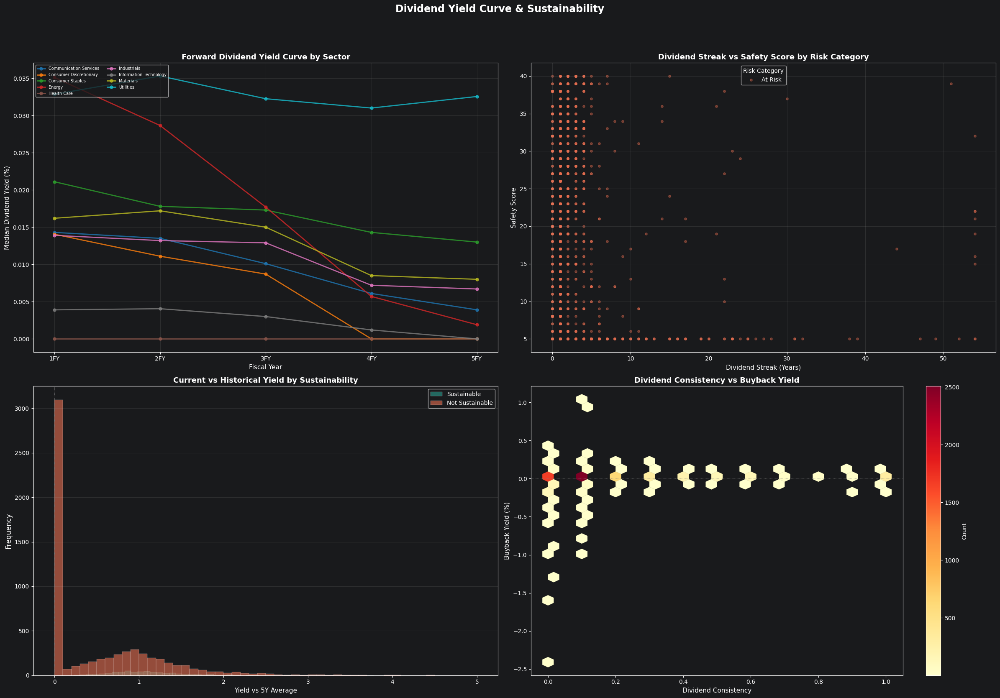

In [26]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(24, 16))
fig.suptitle('Dividend Yield Curve & Sustainability', fontsize=17, fontweight='bold', y=1.04)

# Panel 1: Forward dividend yield curve (1FY through 5FY) by sector
ax1 = axes[0, 0]
div_cols = ['div_yield_1fy_ind', 'div_yield_2fyind', 'div_yield_3fyind',
            'div_yield_4fyind', 'div_yield_5fyind']
div_labels = ['1FY', '2FY', '3FY', '4FY', '5FY']
sectors = sorted(returns_df['sector'].dropna().unique())
palette = plt.cm.tab10(np.linspace(0, 1, len(sectors)))
for s, color in zip(sectors, palette):
    means = [returns_df.loc[returns_df['sector'] == s, c].median() for c in div_cols]
    ax1.plot(div_labels, means, marker='o', linewidth=2, markersize=5, label=s, color=color, alpha=0.8)
ax1.set_xlabel('Fiscal Year', fontsize=11)
ax1.set_ylabel('Median Dividend Yield (%)', fontsize=11)
ax1.set_title('Forward Dividend Yield Curve by Sector', fontsize=13, fontweight='bold')
ax1.legend(fontsize=7, ncol=2, loc='upper left')
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.grid(alpha=0.2)

# Panel 2: Dividend streak vs safety score
ax2 = axes[0, 1]
valid = returns_df[['dividend_streak_y', 'safety_score', 'risk_category']].dropna()
risk_colors = {'Safe': '#2A9D8F', 'Moderate': '#E9C46A', 'At Risk': '#E76F51', 'Unsafe': '#E63946'}
for rc, color in risk_colors.items():
    sub = valid[valid['risk_category'] == rc]
    if len(sub) > 0:
        ax2.scatter(sub['dividend_streak_y'], sub['safety_score'],
                    alpha=0.4, s=15, color=color, label=rc)
ax2.set_xlabel('Dividend Streak (Years)', fontsize=11)
ax2.set_ylabel('Safety Score', fontsize=11)
ax2.set_title('Dividend Streak vs Safety Score by Risk Category', fontsize=13, fontweight='bold')
ax2.legend(title='Risk Category', fontsize=10)
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)
ax2.grid(alpha=0.2)

# Panel 3: Yield vs 5Y average by sustainable flag
ax3 = axes[1, 0]
valid2 = returns_df[['yield_vs_5y_avg', 'sustainable_flag']].dropna()
valid2 = valid2[valid2['yield_vs_5y_avg'].between(-5, 5)]
for flag, color, label in [(1, '#2A9D8F', 'Sustainable'), (0, '#E76F51', 'Not Sustainable')]:
    vals = valid2.loc[valid2['sustainable_flag'] == flag, 'yield_vs_5y_avg']
    ax3.hist(vals, bins=50, alpha=0.6, color=color, label=label, edgecolor='white', linewidth=0.3)
ax3.axvline(0, color='grey', linestyle=':', linewidth=0.8)
ax3.set_xlabel('Yield vs 5Y Average', fontsize=11)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title('Current vs Historical Yield by Sustainability', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.spines['top'].set_visible(True)
ax3.spines['right'].set_visible(True)
ax3.grid(axis='y', alpha=0.2)

# Panel 4: Dividend consistency vs buyback yield
ax4 = axes[1, 1]
valid3 = returns_df[['dividend_consistency', 'buyback_yield']].dropna()
valid3 = valid3[valid3['buyback_yield'].between(-5, 15)]
hb = ax4.hexbin(valid3['dividend_consistency'], valid3['buyback_yield'],
                gridsize=30, cmap='YlOrRd', mincnt=1, linewidths=0.2)
plt.colorbar(hb, ax=ax4, label='Count')
ax4.set_xlabel('Dividend Consistency', fontsize=11)
ax4.set_ylabel('Buyback Yield (%)', fontsize=11)
ax4.set_title('Dividend Consistency vs Buyback Yield', fontsize=13, fontweight='bold')
ax4.axhline(0, color='grey', linestyle=':', linewidth=0.8, alpha=0.6)
ax4.spines['top'].set_visible(True)
ax4.spines['right'].set_visible(True)

plt.tight_layout()
plt.show()


**Composite Risk-Return Landscape**


In [27]:
import plotly.graph_objects as go
import numpy as np

# Risk-return-quality 3D scatter
scatter_cols = ['composite_score', 'altman_z_score', 'implied_return_pt']
hover_cols = ['ticker', 'name', 'sector', 'industry', 'quality_tier', 'risk_level',
              'agreement_score', 'weighted_agreement', 'signal', 'safety_score', 'market_cap', 'enterprise_value']
plot_df = returns_df[scatter_cols + hover_cols].dropna(subset=scatter_cols).copy()

for col in scatter_cols:
    lo, hi = plot_df[col].quantile(0.01), plot_df[col].quantile(0.99)
    plot_df[col] = plot_df[col].clip(lo, hi)

tiers = sorted(plot_df['quality_tier'].dropna().unique())

fig = go.Figure()

for tier in tiers:
    subset = plot_df[plot_df['quality_tier'] == tier]
    fig.add_trace(go.Scatter3d(
        x=subset['composite_score'],
        y=subset['altman_z_score'],
        z=subset['implied_return_pt'],
        mode='markers',
        name=tier,
        marker=dict(size=3, opacity=0.6),
        text=subset.apply(
            lambda r: (
                f"<b>{r['ticker']}</b> — {r['name']}<br>"
                f"<b>Sector:</b> {r['sector']}<br>"
                f"<b>Industry:</b> {r['industry']}<br>"
                f"<b>Quality:</b> {r['quality_tier']} | "
                f"<b>Risk:</b> {r['risk_level']}<br>"
                f"<b>Signal:</b> {r['signal']}<br>"
                f"<b>Agreement:</b> {r['agreement_score']} | "
                f"<b>Weighted:</b> {r['weighted_agreement']:.2f}<br>"
                f"<b>Safety:</b> {r['safety_score']:.1f}<br>"
                f"<b>Market Cap:</b> {r['market_cap']:,.0f} | "
                f"<b>EV:</b> {r['enterprise_value']:,.0f}"
            ), axis=1
        ),
        hoverinfo='text'
    ))

fig.update_layout(
    title=dict(
        text='Composite Risk-Return-Quality Landscape',
        font=dict(size=18, family='Arial', color='#E0E0E0'),
        x=0.5
    ),
    paper_bgcolor='#1a1a2e',
    plot_bgcolor='#1a1a2e',
    font=dict(color='#E0E0E0'),
    scene=dict(
        xaxis_title='Composite Score',
        yaxis_title='Altman Z-Score',
        zaxis_title='Implied Return PT (%)',
        xaxis=dict(backgroundcolor='#16213e', gridcolor='#2a2a4a',
                   color='#E0E0E0', zerolinecolor='#4a4a6a'),
        yaxis=dict(backgroundcolor='#16213e', gridcolor='#2a2a4a',
                   color='#E0E0E0', zerolinecolor='#4a4a6a'),
        zaxis=dict(backgroundcolor='#16213e', gridcolor='#2a2a4a',
                   color='#E0E0E0', zerolinecolor='#4a4a6a'),
        bgcolor='#0f3460',
    ),
    legend=dict(
        title=dict(text='Quality Tier', font=dict(color='#E0E0E0', size=12)),
        font=dict(size=10, color='#C0C0C0'),
        bgcolor='rgba(22, 33, 62, 0.85)',
        bordercolor='#2a2a4a',
        borderwidth=1,
        itemsizing='constant',
        tracegroupgap=2,
        yanchor='top', y=0.95,
        xanchor='left', x=1.02
    ),
    hoverlabel=dict(
        bgcolor='#16213e',
        font_size=11,
        font_family='Consolas, monospace',
        font_color='#E0E0E0',
        bordercolor='#4a4a6a'
    ),
    width=1800,
    height=1000,
    margin=dict(l=20, r=20, t=100, b=20),
)

fig.show()


**ArviZ Bayesian Posterior Diagnostics — Cross-Model Return Analysis**

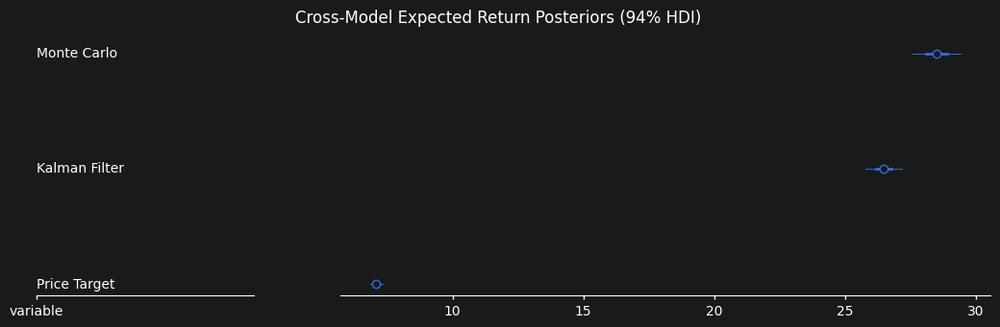

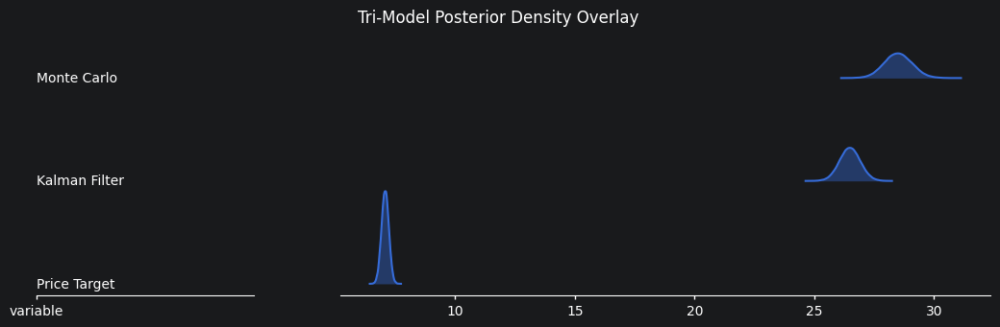

In [28]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

try:
    import arviz_plots as azp
    import arviz_stats as azs

    ARVIZ_AVAILABLE = True
except ImportError:
    try:
        import arviz as az

        ARVIZ_AVAILABLE = True
    except ImportError:
        ARVIZ_AVAILABLE = False

if ARVIZ_AVAILABLE:
    # Bootstrap posterior distributions for tri-model implied returns
    model_cols = {
        'Monte Carlo': 'implied_return_mc',
        'Kalman Filter': 'implied_return_kalman',
        'Price Target': 'implied_return_pt',
    }
    n_chains, n_draws = 8, 10_000
    rng = np.random.default_rng(42)
    posterior_dict = {}

    for model_name, col in model_cols.items():
        if col not in returns_df.columns:
            continue
        vals = returns_df[col].dropna().values
        if len(vals) < 100:
            continue
        samples = np.array([
            [rng.choice(vals, size=len(vals), replace=True).mean() for _ in range(n_draws)]
            for _ in range(n_chains)
        ])
        posterior_dict[model_name] = (['chain', 'draw'], samples)

    if posterior_dict:
        ds = xr.Dataset(posterior_dict, coords={'chain': range(n_chains), 'draw': range(n_draws)})
        dt = xr.DataTree.from_dict({'posterior': xr.DataTree(ds)})

        # Forest plot — 94% HDI for each model's mean return posterior
        try:
            pc = azp.plot_forest(dt, combined=True, backend='matplotlib')
            try:
                pc.add_title('Cross-Model Expected Return Posteriors (94% HDI)')
            except Exception:
                pass
            try:
                fig_forest = pc.viz.ds['figure'].item()
            except Exception:
                fig_forest = pc
            plt.show()
        except Exception as e:
            print(f'Forest plot failed: {e}')

        # Ridge plot — density overlay comparing all three models
        try:
            pc = azp.plot_ridge(dt, combined=True, backend='matplotlib')
            try:
                pc.add_title('Tri-Model Posterior Density Overlay')
            except Exception:
                pass
            plt.show()
        except Exception as e:
            print(f'Ridge plot failed: {e}')
else:
    print('ArviZ not available — skipping Bayesian posterior diagnostics.')

**ArviZ Sector-Level Posterior Analysis**

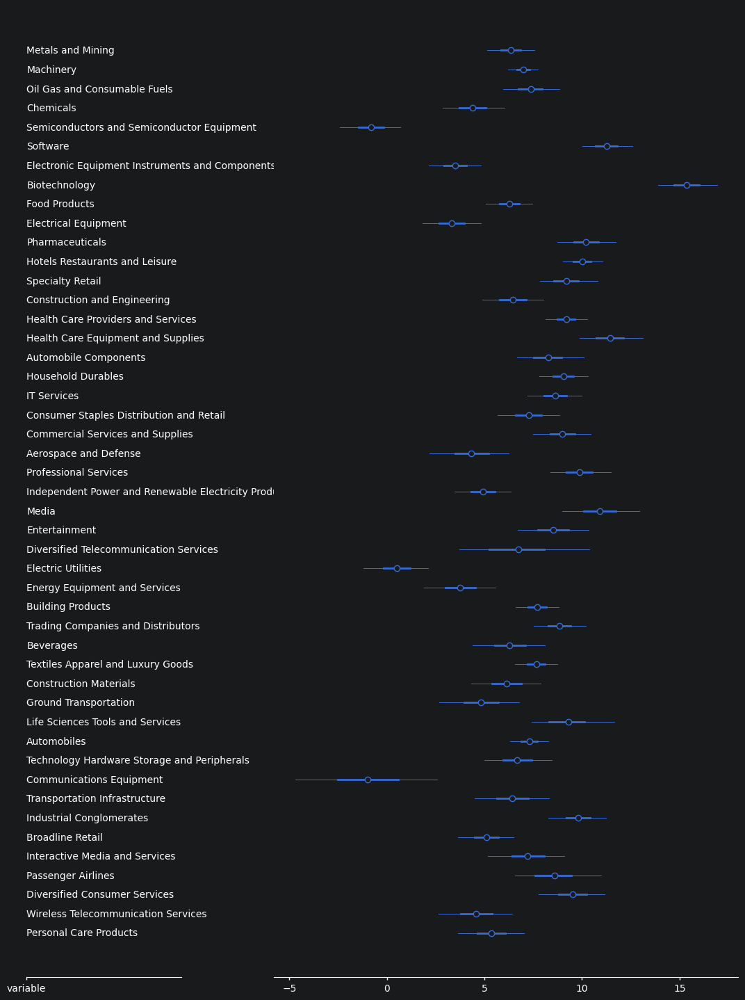

Sector ECDF plot failed: Requested 47 subplots, which exceeds rcParams['plot.max_subplots']=40. Reduce the number of plots or increase this limit.


<Figure size 1600x1400 with 0 Axes>

In [29]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

if ARVIZ_AVAILABLE:
    # Build sector-level bootstrap posteriors for implied_return_pt
    sector_col = 'industry'
    return_col = 'implied_return_pt'
    top_sectors = returns_df[sector_col].value_counts().head(47).index.tolist()
    n_chains, n_draws = 8, 10_000
    rng = np.random.default_rng(42)
    sector_posterior = {}

    for sector in top_sectors:
        vals = returns_df.loc[returns_df[sector_col] == sector, return_col].dropna().values
        if len(vals) < 20:
            continue
        samples = np.array([
            [rng.choice(vals, size=len(vals), replace=True).mean() for _ in range(n_draws)]
            for _ in range(n_chains)
        ])
        sector_posterior[sector] = (['chain', 'draw'], samples)

    if sector_posterior:
        ds = xr.Dataset(sector_posterior, coords={'chain': range(n_chains), 'draw': range(n_draws)})
        dt = xr.DataTree.from_dict({'posterior': xr.DataTree(ds)})

        # Forest plot by sector
        try:
            pc = azp.plot_forest(dt, combined=True, backend='matplotlib')
            try:
                pc.add_title('Sector Expected Return Posteriors (94% HDI)', fontsize=14, fontweight='bold', pad=20)
            except Exception:
                pass
            # Improve spacing
            plt.subplots_adjust(left=0.15, right=0.95, top=0.92, bottom=0.12, hspace=0.4, wspace=0.3)
            plt.show()
        except Exception as e:
            print(f'Sector forest plot failed: {e}')

        # ECDF comparison across sectors with improved padding
        try:
            # Create figure with explicit control over layout
            fig = plt.figure(figsize=(16, 14))
            pc = azp.plot_dist(dt, kind='ecdf', backend='matplotlib')
            try:
                fig.suptitle('Sector Return ECDF Comparison',
                             fontsize=16, fontweight='bold', y=0.995, va='top')
            except Exception:
                pass
            # Improved spacing for ECDF subplots
            plt.subplots_adjust(left=0.10, right=0.97, top=0.96, bottom=0.08,
                                hspace=0.45, wspace=0.35)
            plt.show()
        except Exception as e:
            print(f'Sector ECDF plot failed: {e}')
else:
    print('ArviZ not available — skipping sector posterior analysis.')

**ArviZ Risk Factor Posterior Diagnostics**

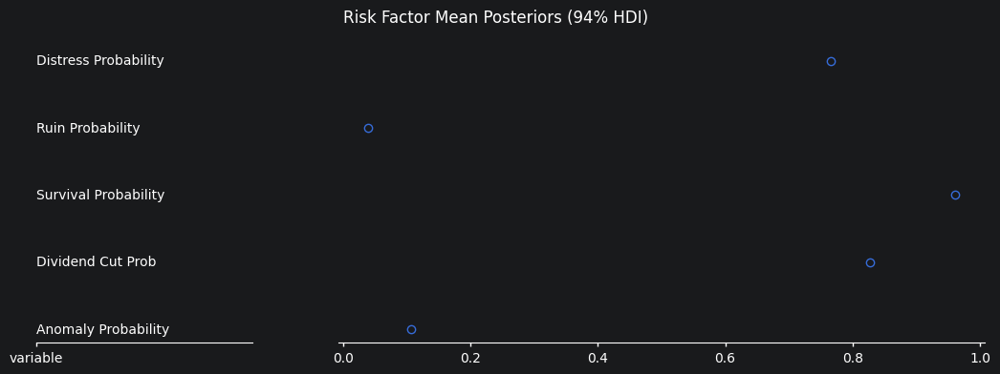

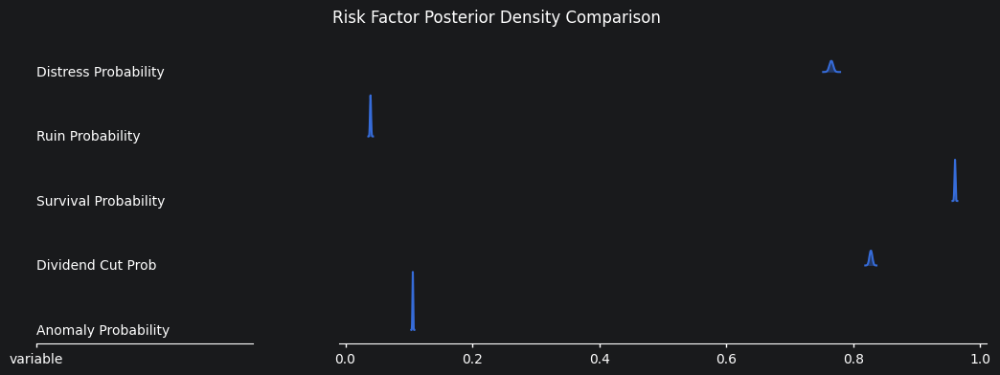

In [30]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

if ARVIZ_AVAILABLE:
    # Bootstrap posteriors for key risk metrics
    risk_metrics = {
        'Distress Probability': 'distress_probability',
        'Ruin Probability': 'ruin_probability',
        'Survival Probability': 'survival_probability',
        'Dividend Cut Prob': 'dividend_cut_probability',
        'Anomaly Probability': 'anomaly_conditional_probability',

    }
    n_chains, n_draws = 8, 10_000
    rng = np.random.default_rng(42)
    risk_posterior = {}

    for label, col in risk_metrics.items():
        if col not in returns_df.columns:
            continue
        vals = returns_df[col].dropna().values
        if len(vals) < 20:
            continue
        samples = np.array([
            [rng.choice(vals, size=len(vals), replace=True).mean() for _ in range(n_draws)]
            for _ in range(n_chains)
        ])
        risk_posterior[label] = (['chain', 'draw'], samples)

    if risk_posterior:
        ds = xr.Dataset(risk_posterior, coords={'chain': range(n_chains), 'draw': range(n_draws)})
        dt = xr.DataTree.from_dict({'posterior': xr.DataTree(ds)})

        # Forest plot of risk factor posteriors
        try:
            pc = azp.plot_forest(dt, combined=True, backend='matplotlib')
            try:
                pc.add_title('Risk Factor Mean Posteriors (94% HDI)')
            except Exception:
                pass
            plt.show()
        except Exception as e:
            print(f'Risk factor forest plot failed: {e}')

        # Ridge overlay for risk metrics
        try:
            pc = azp.plot_ridge(dt, combined=True, backend='matplotlib')
            try:
                pc.add_title('Risk Factor Posterior Density Comparison')
            except Exception:
                pass
            plt.show()
        except Exception as e:
            print(f'Risk factor ridge plot failed: {e}')
else:
    print('ArviZ not available — skipping risk factor posterior diagnostics.')

**Plotly Interactive Sunburst — Quality Tier × Sector × Signal Breakdown**

In [31]:
import plotly.express as px

sunburst_df = returns_df[['sector', 'quality_tier', 'signal', 'implied_return_pt']].dropna().copy()
sunburst_df['count'] = 1

fig = px.sunburst(
    sunburst_df,
    path=['sector', 'quality_tier', 'signal'],
    values='count',
    color='implied_return_pt',
    color_continuous_scale='RdYlGn',
    color_continuous_midpoint=0,
    title='Quality Tier × Sector × Signal Breakdown (colored by Mean Implied Return PT)',
)
fig.update_layout(
    paper_bgcolor='#1a1a2e',
    font=dict(color='#E0E0E0'),
    title_font=dict(size=16),
    width=1200,
    height=900,
    margin=dict(l=10, r=10, t=80, b=10),
)
fig.show()

**Plotly Parallel Coordinates — Multi-Signal Feature Exploration**

In [32]:
import plotly.graph_objects as go
import numpy as np

pc_cols = [
    'implied_return_mc', 'implied_return_kalman', 'implied_return_pt',
    'dividend_cut_probability', 'achievement_probability', 'posterior_beat_prob', 'resampled_posterior_mean',
    'prob_beat_given_momentum', 'anomaly_conditional_probability', 'anomaly_risk_rank', 'debt_maturity_risk',
    'distress_risk_score', 'composite_score', 'weighted_agreement', 'conficence_level', 'model_confidence',
    'impairment_risk_score'
]
avail_pc = [c for c in pc_cols if c in returns_df.columns]
pc_df = returns_df[avail_pc + ['confidence_level']].dropna().copy()

# Encode confidence score numerically for coloring
tier_map = {t: i for i, t in enumerate(sorted(pc_df['confidence_level'].unique()))}
pc_df['tier_code'] = pc_df['confidence_level'].map(tier_map)

dimensions = []
for col in avail_pc:
    lo, hi = pc_df[col].quantile(0.02), pc_df[col].quantile(0.98)
    dimensions.append(dict(
        range=[lo, hi],
        label=col.replace('_', ' ').title(),
        values=pc_df[col].clip(lo, hi)
    ))

fig = go.Figure(data=go.Parcoords(
    line=dict(
        color=pc_df['tier_code'],
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title='Confidence Level', tickvals=list(tier_map.values()),
                      ticktext=list(tier_map.keys())),
    ),
    dimensions=dimensions,
))

fig.update_layout(
    title=dict(text='Multi-Signal Parallel Coordinates (colored by Confidence Level)',
               font=dict(size=16, color='#E0E0E0'), x=0.5),
    paper_bgcolor='#1a1a2e',
    plot_bgcolor='#16213e',
    font=dict(color='#E0E0E0', size=10),
    width=2500,
    height=700,
    margin=dict(l=80, r=80, t=100, b=30),
)
fig.show()

**Plotly Treemap — Sector × Industry Mean Returns**

In [33]:
import plotly.express as px

tree_df = returns_df[['sector', 'industry', 'implied_return_pt', 'market_cap']].dropna().copy()
tree_agg = tree_df.groupby(['sector', 'industry']).agg(
    mean_return=('implied_return_pt', 'mean'),
    total_market_cap=('market_cap', 'sum'),
    stock_count=('implied_return_pt', 'size'),
).reset_index()

fig = px.treemap(
    tree_agg,
    path=['sector', 'industry'],
    values='stock_count',
    color='mean_return',
    color_continuous_scale='RdYlGn',
    color_continuous_midpoint=0,
    title='Sector × Industry Treemap (size = stock count, color = mean implied return PT)',
    hover_data={'total_market_cap': ':,.0f', 'mean_return': ':.2f', 'stock_count': True},
)
fig.update_layout(
    paper_bgcolor='#1a1a2e',
    font=dict(color='#E0E0E0'),
    title_font=dict(size=16),
    width=1400,
    height=800,
    margin=dict(l=10, r=10, t=80, b=10),
)
fig.show()

**Plotly Interactive Risk-Return Scatter with Marginal Distributions**

In [34]:
import plotly.express as px

scatter_df = returns_df[['implied_return_pt', 'var_5_pct', 'sector', 'industry', 'country', 'trading_country',
                         'exchange',
                         'ticker', 'name', 'quality_tier', 'market_cap', 'enterprise_value']].dropna().copy()
scatter_df = scatter_df[
    scatter_df['implied_return_pt'].between(
        scatter_df['implied_return_pt'].quantile(0.01),
        scatter_df['implied_return_pt'].quantile(0.99))
]

fig = px.scatter(
    scatter_df,
    x='var_5_pct',
    y='implied_return_pt',
    color='industry',
    size='market_cap',
    size_max=20,
    hover_name='ticker',
    hover_data=['name', 'sector', 'industry', 'country', 'trading_country', 'exchange', 'quality_tier', 'market_cap',
                'enterprise_value'],
    marginal_x='histogram',
    marginal_y='histogram',
    title='Risk-Return Scatter with Marginal Distributions',
    labels={
        'var_5_pct': '5% VaR',
        'implied_return_pt': 'Implied Return PT (%)',
    },
)
fig.update_layout(
    template='plotly_dark',
    paper_bgcolor='#1a1a2e',
    plot_bgcolor='#16213e',
    font=dict(color='#E0E0E0'),
    title_font=dict(size=16),
    width=1400,
    height=900,
    margin=dict(l=60, r=60, t=100, b=60),
)
fig.show()

**Summary Statistics — Key Metrics by Sector**

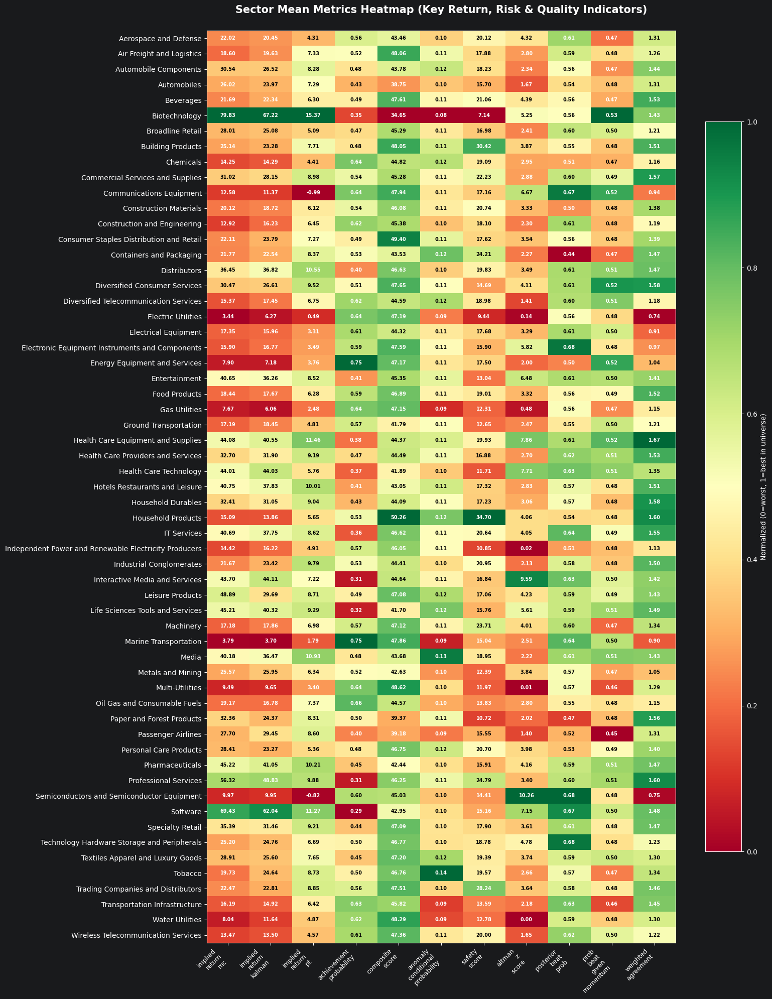

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

summary_cols = [
    'implied_return_mc', 'implied_return_kalman', 'implied_return_pt',
    'achievement_probability', 'composite_score', 'debt_maturity_risk', 'anomaly_conditional_probability',
    'safety_score', 'altman_z_score', 'posterior_beat_prob', 'prob_beat_given_momentum', 'weighted_agreement'
]
avail = [c for c in summary_cols if c in returns_df.columns]

sector_summary = returns_df.groupby('industry')[avail].agg(['mean', 'median', 'std', 'count'])
sector_summary.columns = ['_'.join(col).strip() for col in sector_summary.columns.values]

# Heatmap of sector means for key metrics
mean_cols = [f'{c}_mean' for c in avail]
heatmap_data = sector_summary[mean_cols].copy()
heatmap_data.columns = [c.replace('_mean', '') for c in mean_cols]

fig, ax = plt.subplots(figsize=(16, 20))

# Normalize per column for display
normed = heatmap_data.copy()
for col in normed.columns:
    cmin, cmax = normed[col].min(), normed[col].max()
    if cmax > cmin:
        normed[col] = (normed[col] - cmin) / (cmax - cmin)
    else:
        normed[col] = 0.5

im = ax.imshow(normed.values, cmap='RdYlGn', aspect='auto')
ax.set_xticks(range(len(normed.columns)))
ax.set_xticklabels([c.replace('_', '\n') for c in normed.columns], fontsize=9, rotation=45, ha='right')
ax.set_yticks(range(len(normed.index)))
ax.set_yticklabels(normed.index, fontsize=10)

# Annotate with raw values
for i in range(len(normed.index)):
    for j in range(len(normed.columns)):
        raw_val = heatmap_data.iloc[i, j]
        text_color = 'white' if normed.iloc[i, j] < 0.3 or normed.iloc[i, j] > 0.7 else 'black'
        ax.text(j, i, f'{raw_val:.2f}', ha='center', va='center', fontsize=7,
                color=text_color, fontweight='bold')

cbar = fig.colorbar(im, ax=ax, shrink=0.8)
cbar.set_label('Normalized (0=worst, 1=best in universe)', fontsize=10)
ax.set_title('Sector Mean Metrics Heatmap (Key Return, Risk & Quality Indicators)',
             fontsize=15, fontweight='bold', pad=25)
fig.tight_layout()
plt.show()

**Distribution Fit Analysis — KDE Overlays for Implied Returns**

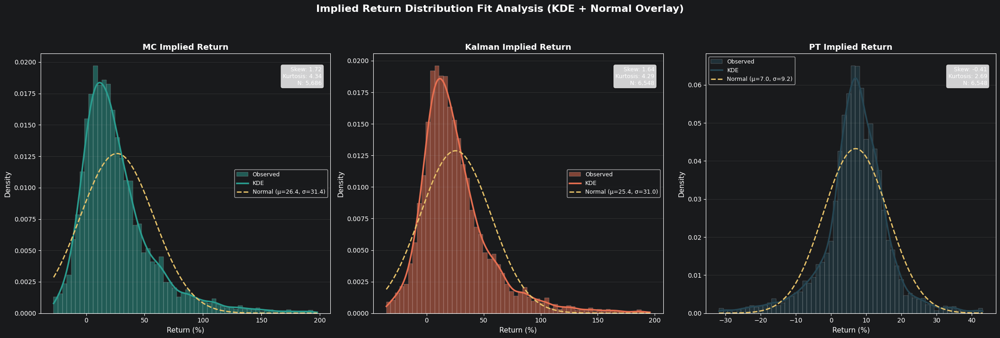

In [36]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde, norm, skew, kurtosis

fig, axes = plt.subplots(1, 3, figsize=(22, 7))
fig.suptitle('Implied Return Distribution Fit Analysis (KDE + Normal Overlay)',
             fontsize=16, fontweight='bold', y=1.05)

metrics = ['implied_return_mc', 'implied_return_kalman', 'implied_return_pt']
titles = ['MC Implied Return', 'Kalman Implied Return', 'PT Implied Return']
colors = ['#2A9D8F', '#E76F51', '#264653']

for ax, metric, title, color in zip(axes, metrics, titles, colors):
    data = returns_df[metric].dropna()
    lower, upper = data.quantile(0.01), data.quantile(0.99)
    clipped = data[(data >= lower) & (data <= upper)]

    # Histogram (density)
    ax.hist(clipped, bins=60, density=True, color=color, alpha=0.5,
            edgecolor='white', linewidth=0.3, label='Observed')

    # KDE overlay
    kde = gaussian_kde(clipped)
    x_grid = np.linspace(clipped.min(), clipped.max(), 300)
    ax.plot(x_grid, kde(x_grid), color=color, linewidth=2.5, label='KDE')

    # Normal fit overlay
    mu, sigma = clipped.mean(), clipped.std()
    ax.plot(x_grid, norm.pdf(x_grid, mu, sigma), color='#E9C46A',
            linewidth=2, linestyle='--', label=f'Normal (\u03bc={mu:.1f}, \u03c3={sigma:.1f})')

    # Summary stats annotation
    sk = skew(clipped)
    ku = kurtosis(clipped)
    stats_text = f'Skew: {sk:.2f}\nKurtosis: {ku:.2f}\nN: {len(clipped):,}'
    ax.text(0.97, 0.95, stats_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', horizontalalignment='right',
            bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.8))

    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xlabel('Return (%)', fontsize=11)
    ax.set_ylabel('Density', fontsize=11)
    ax.legend(fontsize=9)
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.grid(axis='y', alpha=0.2)

plt.tight_layout()
plt.show()

**Risk-Return Efficient Frontier by Industry**

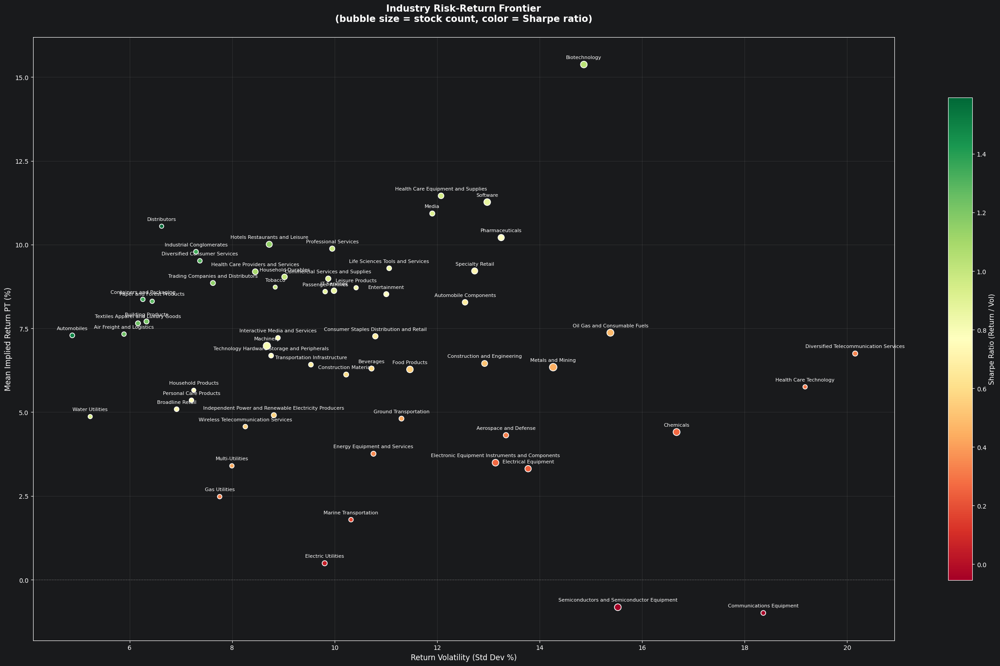

In [37]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

fig, ax = plt.subplots(figsize=(25, 15))

sectors = returns_df['industry'].dropna().unique()
sector_stats = []

for s in sectors:
    sub = returns_df.loc[returns_df['industry'] == s, 'implied_return_pt'].dropna()
    if len(sub) < 10:
        continue
    sector_stats.append({
        'industry': s,
        'mean_return': sub.mean(),
        'volatility': sub.std(),
        'count': len(sub),
        'sharpe': sub.mean() / sub.std() if sub.std() > 0 else 0,
    })

sf = pd.DataFrame(sector_stats)

scatter = ax.scatter(sf['volatility'], sf['mean_return'],
                     c=sf['sharpe'], cmap='RdYlGn', s=sf['count'] * 0.3 + 40,
                     edgecolors='white', linewidths=1.2, zorder=5)
cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
cbar.set_label('Sharpe Ratio (Return / Vol)', fontsize=11)

for _, row in sf.iterrows():
    ax.annotate(row['industry'], (row['volatility'], row['mean_return']),
                fontsize=8, ha='center', va='bottom',
                textcoords='offset points', xytext=(0, 8))

ax.axhline(0, color='grey', linestyle='--', linewidth=0.8, alpha=0.5)
ax.set_xlabel('Return Volatility (Std Dev %)', fontsize=12)
ax.set_ylabel('Mean Implied Return PT (%)', fontsize=12)
ax.set_title('Industry Risk-Return Frontier\n(bubble size = stock count, color = Sharpe ratio)',
             fontsize=15, fontweight='bold', pad=25)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.grid(alpha=0.2)

plt.tight_layout()
plt.show()

**Model Disagreement Deep Dive — Pairwise Scatter Matrix**

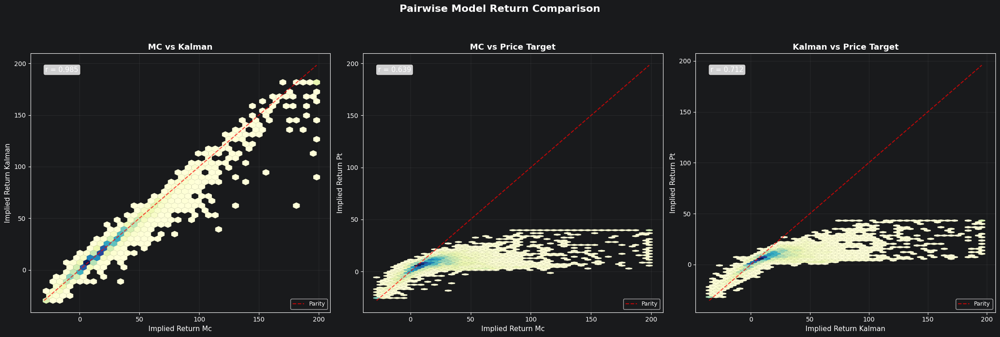

In [38]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(22, 7))
fig.suptitle('Pairwise Model Return Comparison', fontsize=16, fontweight='bold', y=1.05)

pairs = [
    ('implied_return_mc', 'implied_return_kalman', 'MC vs Kalman'),
    ('implied_return_mc', 'implied_return_pt', 'MC vs Price Target'),
    ('implied_return_kalman', 'implied_return_pt', 'Kalman vs Price Target'),
]

for ax, (col_x, col_y, title) in zip(axes, pairs):
    valid = returns_df[[col_x, col_y]].dropna()
    x = valid[col_x].clip(valid[col_x].quantile(0.01), valid[col_x].quantile(0.99))
    y = valid[col_y].clip(valid[col_y].quantile(0.01), valid[col_y].quantile(0.99))

    ax.hexbin(x, y, gridsize=40, cmap='YlGnBu', mincnt=1, linewidths=0.1)

    # Parity line
    lims = [min(x.min(), y.min()), max(x.max(), y.max())]
    ax.plot(lims, lims, '--', color='red', linewidth=1.5, alpha=0.7, label='Parity')

    # Correlation
    corr = x.corr(y)
    ax.text(0.05, 0.95, f'r = {corr:.3f}', transform=ax.transAxes, fontsize=11,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    ax.set_xlabel(col_x.replace('_', ' ').title(), fontsize=11)
    ax.set_ylabel(col_y.replace('_', ' ').title(), fontsize=11)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

**Comprehensive Descriptive Statistics**

In [39]:
import pandas as pd
import numpy as np

key_metrics = [
    'implied_return_mc', 'implied_return_kalman', 'implied_return_pt',
    'expected_upside_mc', 'expected_upside_kalman', 'expected_upside_pt',
    'achievement_probability', 'prob_positive_upside', 'risk_reward_ratio',
    'composite_score', 'weighted_agreement', 'agreement_score',
    'posterior_beat_prob', 'confidence_score', 'analyst_conviction',
    'distress_probability', 'survival_probability', 'ruin_probability',
    'altman_z_score', 'safety_score', 'dividend_cut_probability',
    'anomaly_severity_score', 'liquidity_stress_score', 'balance_sheet_strength',
]
avail = [c for c in key_metrics if c in returns_df.columns]

desc = returns_df[avail].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95]).T
desc['skew'] = returns_df[avail].skew()
desc['kurtosis'] = returns_df[avail].apply(lambda x: x.dropna().pipe(
    lambda s: ((s - s.mean()) / s.std()).pow(4).mean() - 3 if len(s) > 3 else np.nan
))
desc['iqr'] = desc['75%'] - desc['25%']
desc['cv'] = (desc['std'] / desc['mean'].abs()).where(desc['mean'].abs() > 0.001)

print('=' * 100)
print('COMPREHENSIVE DESCRIPTIVE STATISTICS — KEY MODEL METRICS')
print('=' * 100)
print(desc.round(4).to_string())
print(f'\nTotal stocks in universe: {len(returns_df):,}')
print(f'Columns analysed: {len(avail)}')

COMPREHENSIVE DESCRIPTIVE STATISTICS — KEY MODEL METRICS
                           count      mean       std        min       5%      25%       50%       75%       95%        max     skew   kurtosis      iqr       cv
implied_return_mc         5804.0   28.5079   44.2394   -95.5596 -11.1436   5.8553   19.4474   38.4335   95.4586   916.3584   5.1832    57.9746  32.5781   1.5518
implied_return_kalman     6682.0   26.4915   35.6260   -35.3347 -13.1496   5.5597   18.8996   37.6928   91.7065   195.9942   2.0162     6.1940  32.1330   1.3448
implied_return_pt         6682.0    7.0803   12.5087   -86.0036 -10.9315   2.9697    7.3021   12.1198   21.9498   174.8652   1.0093    21.6839   9.1501   1.7667
expected_upside_mc        5804.0   28.5079   44.2394   -95.5596 -11.1436   5.8553   19.4474   38.4335   95.4586   916.3584   5.1832    57.9746  32.5781   1.5518
expected_upside_kalman    6682.0   24.1776   37.5221   -92.7763 -11.6695   5.0267   17.0900   33.8963   79.8233   724.9868   4.6106    47.